<a href="https://colab.research.google.com/github/nidhihegde001/CRISMIS/blob/master/RPN_R50_notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from PIL import Image
from numpy import asarray
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import xml.etree.ElementTree as ET
import matplotlib.pyplot as plt
import time
import os
import copy
from torchvision.datasets.voc import VisionDataset
import torch.nn.functional as F

In [ ]:
import math
import torch.utils.model_zoo as model_zoo
from torchvision.ops import nms

In [ ]:
from matplotlib.patches import Rectangle

In [ ]:
#increasing the default plot size
fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 20
fig_size[1] = 10
plt.rcParams["figure.figsize"] = fig_size

In [ ]:
data_transforms = {
    'train': transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
    ]),
    'valid': transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
    ]),
}

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


In [ ]:
import collections

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
!unzip '/content/drive/My Drive/CRISMIS/roboflow_1161_voc.zip'

----------
    Generates anchors on different feature maps obtained from FPN
      level7 -> Size of Feature Map: (8,8)  area [64.0,128.0,256.0]  ratios = [0.5, 1, 2]
      level6 -> Size of Feature Map: (16,16)  area [16.0, 32.0, 64.0]  ratios = [0.5, 1, 2]
      level5 -> Size of Feature Map: (32,32)  area [16.0, 32.0, 64.0]  ratios = [0.5, 1, 2]
      level4 -> Size of Feature Map: (64,64)  area [16.0, 32.0, 64.0]  ratios = [0.5, 1, 2]
      level3 -> Size of Feature Map: (128,128)  area [16.0, 32.0, 64.0]  ratios = [0.5, 1, 2]

----------

In [ ]:
class Anchors():
      def __init__(self):
        super(Anchors, self).__init__()

      def generate_at_level(self,level):
        if level==7:
          anchor_areas = [ x**2 for x in [64.0,128.0,256.0]]
        else:
          anchor_areas = [ x**2 for x in [16.0, 32.0, 64.0]]
        ratios = [0.5, 1, 2]
        # anchor_scales = [2 ** x for x in [0, 1 / 3, 2 / 3]]
        anchor_scales = [1]
        fe_size = 2**(10 - level)
        anchors = np.zeros((len(anchor_areas)*len(ratios)*len(anchor_scales)*fe_size*fe_size, 4),dtype=np.float32)
        ctr =  np.zeros((fe_size*fe_size, 2),dtype=np.float32)
        # print("Total no of anchors:", anchors.shape)
        # Generate centers for each feature map pixel
        pts = np.arange(1024/fe_size-1, 1024, 1024/fe_size)
        index = 0
        for x in range(len(pts)):
            for y in range(len(pts)):
                ctr[index, 0] = pts[x] - 1024/(fe_size*2)
                ctr[index, 1] = pts[y] - 1024/(fe_size*2)
                index +=1
        # Code to generate anchors at a location in Fmap
        index = 0
        for c in ctr:
          ctr_y, ctr_x = c
          for i in range(len(ratios)):
            for j in range(len(anchor_scales)):
              for k in range(len(anchor_areas)):
                h = anchor_scales[j] * np.sqrt(anchor_areas[k]/ratios[i])
                w = anchor_scales[j] * (anchor_areas[k]/h)
                anchors[index, 0] = ctr_y - h / 2.
                anchors[index, 1] = ctr_x - w / 2.
                anchors[index, 2] = ctr_y + h / 2.
                anchors[index, 3] = ctr_x + w / 2.
                index += 1
        # print("Initial Anchors:")
        # print(anchors)
        valid_anchors = anchors
        valid_anchors[:, slice(0, 4, 2)] = np.clip(
                    anchors[:, slice(0, 4, 2)], 0, 1024)
        valid_anchors[:, slice(1, 4, 2)] = np.clip(
            anchors[:, slice(1, 4, 2)], 0, 1024)
        return valid_anchors

      def generate_all(self):
        locations=[]
        for level in range(3,8):
          loc = self.generate_at_level(level)
          locations.append(loc)
        anchor_locations = np.concatenate((locations[0],locations[1],locations[2],locations[3],locations[4]),axis = 0)
        # print(anchor_locations.shape)
        return anchor_locations


----------
     Plots predictions  ** Can be used in an IPython environment only

      Parameters
      ----------
        inp : Image tensor after appyling transformation
        gt_bbox : A list containing gt boxes
        anchors : A list of predictions
      ----------
      

In [ ]:
def imshow(inp, gt_bbox, anchors):
  """Imshow for Tensor."""
  inp = inp.numpy().transpose((1, 2, 0))
  mean = np.array([0.5, 0.5, 0.5])
  std = np.array([0.5, 0.5, 0.5])
  inp = std * inp + mean
  inp = np.clip(inp, 0, 1)
  plt.imshow(inp)
  ax = plt.gca()
  # plot each box
  for box in gt_bbox:
    # get coordinates
    y1, x1, y2, x2 = box
    # calculate width and height of the box
    width, height = x2 - x1, y2 - y1
    # create the shape
    rect = Rectangle((x1, y1), width, height, fill=False, color='green')
    # draw the box
    ax.add_patch(rect)
  for box in anchors:
    # get coordinates
    y1, x1, y2, x2 = box
    # calculate width and height of the box
    width, height = x2 - x1, y2 - y1
    # create the shape
    rect = Rectangle((x1, y1), width, height, fill=False, color='red')
    # draw the box
    ax.add_patch(rect)
  plt.show()
    

     ----------
      Generates target outputs for the data.

      Parameters
      ----------
       target: Ground Truth Boxes
       level: A value between 3 to 7

      Returns
      ----------
      labels: Classification Output corresponding to anchors at a level (feature_map_size*9*2)
        locs: Regression Output corresponding to anchors at a level (feature_map_size*9*4)
'''

In [ ]:
def generate_targets(target,level): # data is the training set

  # get gt data
  # input_image = data[index][0].view(1,3,1024,1024)
  # gt_bbox = np.array(data[index][1][0],dtype=np.float32)# y1,x1,y2,x2
  # gt_labels = np.array(data[index][1][1])
  gt_bbox = np.array(target[0],dtype=np.float32)
  gt_labels = np.array(target[1])

  if level==7:
    anchor_areas = [ x**2 for x in [64.0,128.0,256.0]]
  else:
    anchor_areas = [ x**2 for x in [16.0, 32.0, 64.0]]
  ratios = [0.5, 1, 2]
  # anchor_scales = [2 ** x for x in [0, 1 / 3, 2 / 3]]
  anchor_scales = [1]
  fe_size = 2**(10 - level)
  anchors = np.zeros((len(anchor_areas)*len(ratios)*len(anchor_scales)*fe_size*fe_size, 4),dtype=np.float32)
  ctr =  np.zeros((fe_size*fe_size, 2),dtype=np.float32)
  # print("Total no of anchors:", anchors.shape)
  # Generate centers for each feature map pixel
  pts = np.arange(1024/fe_size-1, 1024, 1024/fe_size)
  # print("Centers")
  # print(pts[0])
  # print(pts[-1])
  # print(len(pts))
  index = 0
  for x in range(len(pts)):
      for y in range(len(pts)):
          ctr[index, 0] = pts[x] - 1024/(fe_size*2)
          ctr[index, 1] = pts[y] - 1024/(fe_size*2)
          index +=1

  # Code to generate anchors at a location in Fmap
  index = 0
  for c in ctr:
    ctr_y, ctr_x = c
    for i in range(len(ratios)):
      for j in range(len(anchor_scales)):
        for k in range(len(anchor_areas)):
          h = anchor_scales[j] * np.sqrt(anchor_areas[k]/ratios[i])
          w = anchor_scales[j] * (anchor_areas[k]/h)
          anchors[index, 0] = ctr_y - h / 2.
          anchors[index, 1] = ctr_x - w / 2.
          anchors[index, 2] = ctr_y + h / 2.
          anchors[index, 3] = ctr_x + w / 2.
          index += 1
  # print("Initial Anchors:")
  # print(anchors)
  valid_anchors = anchors
  valid_anchors[:, slice(0, 4, 2)] = np.clip(
              anchors[:, slice(0, 4, 2)], 0, 1024)
  valid_anchors[:, slice(1, 4, 2)] = np.clip(
      anchors[:, slice(1, 4, 2)], 0, 1024)
  # Create labels and anchors for valid anchor boxes
  label = np.empty((len(valid_anchors), ), dtype=np.int32)
  # default initialisation
  label.fill(-1)
  # print("Label shape:",label.shape)  
  # print("Valid Anchors:", valid_anchors)
  if (len(gt_labels)==0):
    anchor_locations = np.empty((len(anchors),) + anchors.shape[1:], dtype=anchors.dtype)
    anchor_locations.fill(0)
    return label,anchor_locations
  ious = np.empty((len(valid_anchors), len(gt_labels)), dtype=np.float32)
  ious.fill(0)

# Calculating iou
  for num1, i in enumerate(valid_anchors):
      ya1, xa1, ya2, xa2 = i  
      anchor_area = (ya2 - ya1) * (xa2 - xa1)
      for num2, j in enumerate(gt_bbox):
          yb1, xb1, yb2, xb2 = j
          box_area = (yb2- yb1) * (xb2 - xb1)
          inter_x1 = max([xb1, xa1])
          inter_y1 = max([yb1, ya1])
          inter_x2 = min([xb2, xa2])
          inter_y2 = min([yb2, ya2])
          if (inter_x1 < inter_x2) and (inter_y1 < inter_y2):
              iter_area = (inter_y2 - inter_y1)*(inter_x2 - inter_x1)
              iou = iter_area/(anchor_area+ box_area - iter_area)            
          else:
              iou = 0
          ious[num1, num2] = iou
  # print('IOU shape:',ious.shape)

  # print("**Case 1 begins...**")
  #case 1
  gt_argmax_ious = ious.argmax(axis=0)
  # print("Indices with maximum overlap with each gt box:", gt_argmax_ious)
  # index 90 with gt1 and 130 with gt2 has maximum overlap
  gt_max_ious = ious[gt_argmax_ious, np.arange(ious.shape[1])]
  # print(gt_max_ious)
  # # anchors with highest iou with gt box
  # gt_argmax_ious = np.where(ious == gt_max_ious)[0]
  # # print("Indices with maximum overlap with each gt box:", gt_argmax_ious)
  # print("their anchor locations:")
  # print(valid_anchors[gt_argmax_ious])
  # print("gt box locations:")
  # print(gt_bbox)
  # print("**Case 2 begins...**")
  # case 2
  # which gt box has max iou with each anchor (box 0 or 1)
  argmax_ious = ious.argmax(axis=1)
  # print('Which gt box has maximum overlap with each anchor:',argmax_ious)
  # max iou with gt box for each anchor
  max_ious = ious[np.arange(len(label)), argmax_ious]
  # print("Corresponding Maximum IOU for each anchor:",max_ious)

  # LABELLING GT ANCHORS
  # print("LABELLING GT ANCHORS...")
  pos_iou_threshold  = 0.5
  neg_iou_threshold = 0.05
  label[max_ious < neg_iou_threshold] = 0
  label[gt_argmax_ious] = 1
  label[max_ious >= pos_iou_threshold] = 1

  # Creating 256 training samples,half positive, half negative
  # pos_ratio = 0.5
  n_neg = 1024
  # n_pos = pos_ratio * n_sample
  pos_index = np.where(label==1)[0]
  # print("No of positive labels:")
  # print(pos_index.shape)
  # imshow(data[ind][0],gt_bbox,valid_anchors[pos_index])
  # # if len(pos_index) > n_pos:
  # #     disable_index = np.random.choice(pos_index, size=(len(pos_index) - n_pos), replace=False)
  # #     label[disable_index] = -1
  # n_neg = n_sample-np.sum(label == 1)
  neg_index = np.where(label == 0)[0]
  # print("No of negative labels:")
  # print(neg_index.shape)
  if len(neg_index) > n_neg:
      disable_index = np.random.choice(neg_index, size=(len(neg_index) - n_neg), replace = False)
      label[disable_index] = -1

  final_neg_anchor_indices = np.where(label==0)[0]
  final_neg_anchors = valid_anchors[final_neg_anchor_indices]
  # imshow(data[ind][0],valid_anchors[pos_index],final_neg_anchors)

# get the most probable gt_bbox at each valid anchor location 
  max_iou_bbox = gt_bbox[argmax_ious]

# Get the correct regression outputs
  # print("Getting regression outputs...")
  height = valid_anchors[:, 2] - valid_anchors[:, 0]
  width = valid_anchors[:, 3] - valid_anchors[:, 1]
  ctr_y = valid_anchors[:, 0] + 0.5 * height
  ctr_x = valid_anchors[:, 1] + 0.5 * width
  base_height = max_iou_bbox[:, 2] - max_iou_bbox[:, 0]
  base_width = max_iou_bbox[:, 3] - max_iou_bbox[:, 1]
  base_ctr_y = max_iou_bbox[:, 0] + 0.5 * base_height
  base_ctr_x = max_iou_bbox[:, 1] + 0.5 * base_width
  eps = np.finfo(height.dtype).eps
  height = np.maximum(height, eps)
  width = np.maximum(width, eps)
  dy = (base_ctr_y - ctr_y) / height
  dx = (base_ctr_x - ctr_x) / width
  dh = np.log(base_height / height)
  dw = np.log(base_width / width)
  anchor_locs = np.vstack((dy, dx, dh, dw)).transpose()
  # print('Correct regression outputs of valid anchor locations=')
  # print(anchor_locs)
  # Final locations
  anchor_locations = np.empty((len(anchors),) + anchors.shape[1:], dtype=anchor_locs.dtype)
  anchor_locations.fill(0)
  # anchor_locations[index_inside, :] = anchor_locs
  anchor_locations = anchor_locs
  # print("Final labels shape:",label.shape)
  # print("Final locaions shape:",anchor_locations.shape)
  return label,anchor_locations
  

In [ ]:
class Cosmic_Detection(VisionDataset):
  def __init__(self,
                root,                 
                mode='train',
                transform=None,
                target_transform=None,
                transforms=None):
      super(Cosmic_Detection, self).__init__(root, transforms, transform, target_transform)

      voc_root = 'roboflow_1161_voc'
      image_dir = os.path.join(voc_root, mode)
      annotation_dir = os.path.join(voc_root, mode +'_annots')

      if not os.path.isdir(voc_root):
          raise RuntimeError('Dataset not found or corrupted')

      file_names = []
      for f in os.listdir(image_dir):
        print(f)
        file_names.append(f[:-4])
      self.images = [os.path.join(image_dir, x + ".jpg") for x in file_names]
      self.annotations = [os.path.join(annotation_dir, x + ".xml") for x in file_names]
      self.anchor_lab = [os.path.join('drive/My Drive/CRISMIS/',mode,"lab", x + ".npy") for x in file_names]
      self.anchor_loc = [os.path.join( 'drive/My Drive/CRISMIS/',mode,"loc",x + ".npy") for x in file_names]
      if not os.path.exists(os.path.join('drive/My Drive/CRISMIS/',mode,"lab")):
        os.makedirs(os.path.join('drive/My Drive/CRISMIS/',mode,"lab"))
      if not os.path.exists(os.path.join('drive/My Drive/CRISMIS/',mode,"loc")):
        os.makedirs(os.path.join('drive/My Drive/CRISMIS/',mode,"loc"))
      assert (len(self.images) == len(self.annotations))

  def __getitem__(self, index):
      img = Image.open(self.images[index]).convert('RGB')
      target = self.parse_voc_xml(ET.parse(self.annotations[index]).getroot())

      if self.transforms is not None:
          img, target = self.transforms(img, target)
      if not (os.path.exists(self.anchor_lab[index]) or os.path.exists(self.anchor_loc[index])):  
        labels = []
        locations=[]
        for level in range(5):
          lab,loc = generate_targets(target,level+3)
          labels.append(lab)
          locations.append(loc)
        anchor_labels = np.concatenate((labels[0],labels[1],labels[2],labels[3],labels[4]),axis = 0)
        anchor_locations = np.concatenate((locations[0],locations[1],locations[2],locations[3],locations[4]),axis = 0)
        np.save(self.anchor_lab[index],anchor_labels)
        np.save(self.anchor_loc[index],anchor_locations)
      else:
        anchor_labels = np.load(self.anchor_lab[index])
        anchor_locations = np.load(self.anchor_loc[index])
      return img.view(1,3,1024,1024), anchor_labels, anchor_locations


  def __len__(self):
      return len(self.images)

  def parse_voc_xml(self, root):
        # extract each bounding box
        boxes = list()
        for box in root.findall('.//bndbox'):
            xmin = int(box.find('xmin').text)
            ymin = int(box.find('ymin').text)
            xmax = int(box.find('xmax').text)
            ymax = int(box.find('ymax').text)
            coors = [ymin, xmin, ymax, xmax]
            boxes.append(coors)
        # extract image dimensions
        width = int(root.find('.//size/width').text)
        height = int(root.find('.//size/height').text)
        # extract all the classes
        labels = list()
        for category in root.findall('.//name'):
          labels.append(category.text)
        return boxes, labels

----------------------
    Provide path to dataset
    Format: PascalVOC

                root
         /     /            \      \ 
    train train_annots  valid  valid_annots

  -----------------------------


In [ ]:
data_dir = 'roboflow_1161_voc/'

crismis_dataset = {x: Cosmic_Detection(None, x, data_transforms[x]) 
                  for x in ['train', 'valid']}

dataloaders = {x: torch.utils.data.DataLoader(crismis_dataset[x], batch_size=1,
                                             shuffle=True, num_workers=4, pin_memory = True)
              for x in ['train', 'valid']}

dataset_sizes = {x: len(crismis_dataset[x]) for x in ['train', 'valid']}

EN1052008076M__512_png.rf.74716509035b33bc9b1084d6036cbfb3.jpg
EN1051949473M__1024_png.rf.ab01128b2f14296197420e61900df2ee.jpg
EW0215980610G__512_png.rf.46cb0caaaa758d12860d227297ec47c0.jpg
EN1064292918M__1024_png.rf.2366cb9225c819724a3efaaaec8ecec2.jpg
EN0215763748M__1024_png.rf.66cb5e65860c3d02867c30dbb2c59ea6.jpg
EN1051921076M__512_png.rf.26bc5e7179b19aeb8fde41e685dc269b.jpg
EW0236426060I__512_png.rf.425aaf4d0b6d9f01c08328df924d5b5c.jpg
EN0227090291M__512_png.rf.bee3c4d7896005b55b8803fcfb559020.jpg
EN0215763752M__1024_png.rf.2b65a69cea939a7335428d6d31d8ecdc.jpg
EN1051921097M__512_png.rf.2cb7642dd9dc3589233dc1317b67cff1.jpg
EN1052094725M__1024_png.rf.2ee75cb21410a9a59baf124245bd65e0.jpg
EW1003930888F__1024_png.rf.5fe67b573583e0a62dc0e4fefbda6ac1.jpg
EN1052268677M__512_png.rf.b19b299c4f21dfb657d0d602d26f2925.jpg
EN1065872523M__512_png.rf.bed45f4504e23d5390dea999892afdd9.jpg
EN1052008100M__512_png.rf.aeac58ac7ded1a9d32daab83267f98b2.jpg
EN1051921102M__512_png.rf.a90d687c18e4a485882734e

In [ ]:
len(dataloaders['train'])

1102

### Final positive and negative anchors based on Ground truth 

In [ ]:
import time
import multiprocessing
use_cuda = torch.cuda.is_available()
core_number = multiprocessing.cpu_count()
batch_size = 1
best_num_worker = [0, 0]
best_time = [99999999, 99999999]
print('cpu_count =',core_number)
def loading_time(num_workers, pin_memory):
        kwargs = {'num_workers': num_workers, 'pin_memory': pin_memory} if use_cuda else {}
        train_loader = torch.utils.data.DataLoader(
            crismis_dataset['train'], batch_size=1, shuffle= False, **kwargs)
        start = time.time()
        for epoch in range(4):
            for batch_idx, (data, cls,reg) in enumerate(train_loader):
                if batch_idx == 15:
                    break
                pass
        end = time.time()
        print("  Used {} second with num_workers = {}".format(end-start,num_workers))
        return end-start
for pin_memory in [False, True]:
        print("While pin_memory =",pin_memory)
        for num_workers in range(0, core_number*2+1, 4): 
            current_time = loading_time(num_workers, pin_memory)
            if current_time < best_time[pin_memory]:
                best_time[pin_memory] = current_time
                best_num_worker[pin_memory] = num_workers
            else: # assuming its a convex function  
                if best_num_worker[pin_memory] == 0:
                    the_range = []
                else:
                    the_range = list(range(best_num_worker[pin_memory] - 3, best_num_worker[pin_memory]))
                for num_workers in (the_range + list(range(best_num_worker[pin_memory] + 1,best_num_worker[pin_memory] + 4))): 
                    current_time = loading_time(num_workers, pin_memory)
                    if current_time < best_time[pin_memory]:
                        best_time[pin_memory] = current_time
                        best_num_worker[pin_memory] = num_workers
                break
if best_time[0] < best_time[1]:
        print("Best num_workers =", best_num_worker[0], "with pin_memory = False")
else:
        print("Best num_workers =", best_num_worker[1], "with pin_memory = True")

cpu_count = 2
While pin_memory = False
  Used 21.300347566604614 second with num_workers = 0
  Used 5.5551557540893555 second with num_workers = 4
While pin_memory = True
  Used 11.46279263496399 second with num_workers = 0
  Used 4.9739508628845215 second with num_workers = 4
Best num_workers = 4 with pin_memory = True


In [ ]:
for inputs,labels,locs in dataloaders['train']:
    print(inputs[0].shape)
    print(labels[0].shape)
    print(locs[0].shape)
    break

torch.Size([1, 3, 1024, 1024])
torch.Size([196416])
torch.Size([196416, 4])


#### Visualization Functions

In [ ]:
def save_loss_graphs(t_c, t_r, t_tot, v_c, v_r, v_tot, start_epoch, no_epochs):
  x = np.arange(start_epoch, start_epoch + no_epochs, 1)
  graphs = ['Classification', 'Regression', 'Total']
  train = [t_c, t_r, t_tot]
  valid = [ v_c, v_r, v_tot]
  for i in range(3):
    plt.plot(x, train[i], label = "Train")
    plt.plot(x, valid[i], label = "Valid")
    plt.xlabel('Epochs')
    plt.xticks(x)
    # Set the y axis label of the current axis.
    plt.ylabel('Loss')
    # plt.yticks(np.arange(0,3,0.1))
    # Set a title of the current axes.
    plt.title( graphs[i] +'Loss') 
    plt.text(start_epoch + no_epochs-10,0.75,"Final Train loss:  " + str(train[i][no_epochs-1]))
    plt.text(start_epoch + no_epochs-10,0.5,"Final Valid loss:  " + str(valid[i][no_epochs-1]))
  # show a legend on the plot
    plt.legend()
  # Display a figure.
    plt.savefig('drive/My Drive/CRISMIS/resnet50/exp4/'+ graphs[i] +'Loss.png')
    plt.show()
    

In [ ]:
class Bottleneck(nn.Module):
    expansion = 4

    def __init__(self, inplanes, planes, stride=1, downsample=None):
        super(Bottleneck, self).__init__()
        self.conv1 = nn.Conv2d(inplanes, planes, kernel_size=1, bias=False)
        self.bn1 = nn.BatchNorm2d(planes)
        self.conv2 = nn.Conv2d(planes, planes, kernel_size=3, stride=stride,
                               padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(planes)
        self.conv3 = nn.Conv2d(planes, planes * 4, kernel_size=1, bias=False)
        self.bn3 = nn.BatchNorm2d(planes * 4)
        self.relu = nn.ReLU(inplace=True)
        self.downsample = downsample
        self.stride = stride

    def forward(self, x):
        residual = x
        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)
        out = self.relu(out)

        out = self.conv3(out)
        out = self.bn3(out)

        if self.downsample is not None:
            residual = self.downsample(x)

        out += residual
        out = self.relu(out)

        return out
model_urls = {
    'resnet50': 'https://download.pytorch.org/models/resnet50-19c8e357.pth'
}
def resnet50(num_classes, pretrained=False, **kwargs):
    """Constructs a ResNet-50 model.
    Args:
        pretrained (bool): If True, returns a model pre-trained on ImageNet
    """
    model = ResNet(num_classes, Bottleneck, [3, 4, 6, 3], **kwargs)
    if pretrained:
        model.load_state_dict(model_zoo.load_url(model_urls['resnet50'], model_dir='.'), strict=False)
    return model
class PyramidFeatures(nn.Module):
    def __init__(self, C3_size, C4_size, C5_size, feature_size=256):
        super(PyramidFeatures, self).__init__()

        # upsample C5 to get P5 from the FPN paper
        self.P5_1 = nn.Conv2d(C5_size, feature_size, kernel_size=1, stride=1, padding=0)
        self.P5_upsampled = nn.Upsample(scale_factor=2, mode='nearest')
        self.P5_2 = nn.Conv2d(feature_size, feature_size, kernel_size=3, stride=1, padding=1)

        # add P5 elementwise to C4
        self.P4_1 = nn.Conv2d(C4_size, feature_size, kernel_size=1, stride=1, padding=0)
        self.P4_upsampled = nn.Upsample(scale_factor=2, mode='nearest')
        self.P4_2 = nn.Conv2d(feature_size, feature_size, kernel_size=3, stride=1, padding=1)

        # add P4 elementwise to C3
        self.P3_1 = nn.Conv2d(C3_size, feature_size, kernel_size=1, stride=1, padding=0)
        self.P3_2 = nn.Conv2d(feature_size, feature_size, kernel_size=3, stride=1, padding=1)

        # "P6 is obtained via a 3x3 stride-2 conv on C5"
        self.P6 = nn.Conv2d(C5_size, feature_size, kernel_size=3, stride=2, padding=1)

        # "P7 is computed by applying ReLU followed by a 3x3 stride-2 conv on P6"
        self.P7_1 = nn.ReLU()
        self.P7_2 = nn.Conv2d(feature_size, feature_size, kernel_size=3, stride=2, padding=1)

    def forward(self, inputs):
        C3, C4, C5 = inputs

        P5_x = self.P5_1(C5)
        P5_upsampled_x = self.P5_upsampled(P5_x)
        P5_x = self.P5_2(P5_x)

        P4_x = self.P4_1(C4)
        P4_x = P5_upsampled_x + P4_x
        P4_upsampled_x = self.P4_upsampled(P4_x)
        P4_x = self.P4_2(P4_x)

        P3_x = self.P3_1(C3)
        P3_x = P3_x + P4_upsampled_x
        P3_x = self.P3_2(P3_x)

        P6_x = self.P6(C5)

        P7_x = self.P7_1(P6_x)
        P7_x = self.P7_2(P7_x)
        # print("start")
        # print(P3_x.shape)
        # print(P4_x.shape)
        # print(P5_x.shape)
        # print(P6_x.shape)
        # print(P7_x.shape)
        # print('end')
        return [P3_x, P4_x, P5_x, P6_x, P7_x]

class Cls_Reg_Head(nn.Module):
    def __init__(self, num_features_in, num_anchors=9, num_classes=2, prior=0.01, feature_size=256):
        super(Cls_Reg_Head, self).__init__()

        self.num_classes = num_classes
        self.num_anchors = num_anchors
        self.conv1 = nn.Conv2d(num_features_in, feature_size, 3, 1, 1)
        self.cls_layer = nn.Conv2d(feature_size, num_anchors * num_classes, 1, 1, 0)
        self.reg_layer = nn.Conv2d(feature_size, num_anchors *4, 1, 1, 0)

    def forward(self, map):
        out_map = self.conv1(map)
        pred_cls = self.cls_layer(out_map)
        pred_reg = self.reg_layer(out_map)
        pred_cls = pred_cls.permute(0, 2, 3, 1).contiguous()
        pred_cls = pred_cls.view(1, map.shape[2], map.shape[3], self.num_anchors, self.num_classes).contiguous().view(map.shape[0],-1, self.num_classes)
        pred_reg = pred_reg.permute(0, 2, 3, 1).contiguous()
        pred_reg = pred_reg.view(1, map.shape[2], map.shape[3], self.num_anchors, 4).contiguous().view(map.shape[0],-1, 4)
        return pred_cls, pred_reg
        
class ResNet(nn.Module):

    def __init__(self, num_classes, block, layers):
        self.inplanes = 64
        super(ResNet, self).__init__()
        self.conv1 = nn.Conv2d(3, 64, kernel_size=7, stride=2, padding=3, bias=False)
        self.bn1 = nn.BatchNorm2d(64)
        self.relu = nn.ReLU(inplace=True)
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)
        self.layer1 = self._make_layer(block, 64, layers[0])
        self.layer2 = self._make_layer(block, 128, layers[1], stride=2)
        self.layer3 = self._make_layer(block, 256, layers[2], stride=2)
        self.layer4 = self._make_layer(block, 512, layers[3], stride=2)

        if block == Bottleneck:
          fpn_sizes = [self.layer2[layers[1] - 1].conv3.out_channels, self.layer3[layers[2] - 1].conv3.out_channels,
                       self.layer4[layers[3] - 1].conv3.out_channels]

        self.fpn = PyramidFeatures(fpn_sizes[0], fpn_sizes[1], fpn_sizes[2])

        self.head1 = Cls_Reg_Head(256, num_classes=num_classes)
        self.head2 = Cls_Reg_Head(256, num_classes=num_classes)
        self.head3 = Cls_Reg_Head(256, num_classes=num_classes)
        self.head4 = Cls_Reg_Head(256, num_classes=num_classes)
        self.head5 = Cls_Reg_Head(256, num_classes=num_classes)

        for m in self.modules():
          if isinstance(m, nn.Conv2d):
            m.weight.data.normal_(0, 0.01)
            if not (m.bias == None):
              m.bias.data.zero_()
          elif isinstance(m, nn.BatchNorm2d):
            m.weight.data.fill_(1)
            m.bias.data.zero_()

        self.freeze_bn()

    def _make_layer(self, block, planes, blocks, stride=1):
        downsample = None
        if stride != 1 or self.inplanes != planes * block.expansion:
            downsample = nn.Sequential(
                nn.Conv2d(self.inplanes, planes * block.expansion,
                          kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm2d(planes * block.expansion),
            )

        layers = [block(self.inplanes, planes, stride, downsample)]
        self.inplanes = planes * block.expansion
        for i in range(1, blocks):
            layers.append(block(self.inplanes, planes))

        return nn.Sequential(*layers)

    def freeze_bn(self):
        '''Freeze BatchNorm layers.'''
        for layer in self.modules():
            if isinstance(layer, nn.BatchNorm2d):
                layer.eval()

    def forward(self, input):

        # if self.training:
        #     img_batch, annotations = inputs
        # else:
        #     img_batch = inputs

        x = self.conv1(input)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.maxpool(x)
        x1 = self.layer1(x)       
        x2 = self.layer2(x1)   
        x3 = self.layer3(x2)    
        x4 = self.layer4(x3)

        features = self.fpn([x2, x3, x4])
        cls1, reg1 = self.head1(features[0])
        cls2, reg2 = self.head2(features[1])
        cls3, reg3 = self.head3(features[2])
        cls4, reg4 = self.head4(features[3])
        cls5, reg5 = self.head5(features[4])

        classification = torch.cat((cls1,cls2,cls3,cls4,cls5), dim=1)
        regression = torch.cat((reg1,reg2,reg3,reg4,reg5), dim=1)
        # print('Output Shapes')
        # print(classification.shape)
        # print(regression.shape)
        return classification,regression


In [ ]:
class FocalLoss(nn.Module):
  def __init__(self, alpha=0.05, gamma=2,device = device):
      super(FocalLoss, self).__init__()
      self.weight = torch.FloatTensor([alpha, 1-alpha]).to(device)
      self.nllLoss = F.nll_loss
      self.gamma = gamma

  def forward(self, input, target):
      softmax = F.softmax(input, dim=1)
      log_logits = torch.log(softmax)
      fix_weights = (1 - softmax) ** self.gamma
      logits = fix_weights * log_logits
      return self.nllLoss(logits, target,weight = self.weight,ignore_index=-1)

In [ ]:
rpn = resnet50(num_classes=2, pretrained=True)

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to ./resnet50-19c8e357.pth


In [ ]:
rpn = rpn.to(device)

In [ ]:
from tqdm import tqdm_notebook as tqdm

In [ ]:
def train_model(model, focal_loss, start_epoch = 0, num_epochs=25, exp = 4):
  optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)
  since = time.time()
  model_wts = copy.deepcopy(model.state_dict())
  best_loss = 100.0

  if not os.path.exists('drive/My Drive/CRISMIS/resnet50/exp'+str(exp)):
    os.makedirs(os.path.join('drive/My Drive/CRISMIS/resnet50/exp'+str(exp)))

  e_count = start_epoch%20
  rpn_lambda = ((start_epoch-e_count)/20)*0.1

  cls_loss_values = np.load('drive/My Drive/CRISMIS/resnet50/exp4/cls_train.npy').tolist()[:start_epoch]
  reg_loss_values = np.load('drive/My Drive/CRISMIS/resnet50/exp4/reg_train.npy').tolist()[:start_epoch]
  tot_loss_values = np.load('drive/My Drive/CRISMIS/resnet50/exp4/tot_train.npy').tolist()[:start_epoch]

  val_cls_loss_values = np.load('drive/My Drive/CRISMIS/resnet50/exp4/cls_val.npy').tolist()[:start_epoch]
  val_reg_loss_values = np.load('drive/My Drive/CRISMIS/resnet50/exp4/reg_val.npy').tolist()[:start_epoch]
  val_tot_loss_values = np.load('drive/My Drive/CRISMIS/resnet50/exp4/tot_val.npy').tolist()[:start_epoch]

  for epoch in range(num_epochs): 
      e_count+=1  
      if (e_count==20):
          e_count = 0
          rpn_lambda+=0.1
          torch.save(model,'drive/My Drive/CRISMIS/resnet50/exp'+str(exp)+'/rpn_'+str(start_epoch+epoch)+'.pth')
      print('Epoch {}/{}'.format(epoch + start_epoch, start_epoch+ num_epochs-1))
      print('-' * 10)

      # Each epoch has a training and validation phase
      for phase in ['train', 'valid']:
          if phase == 'train':
              model.train()  # Set model to training mode
          else:
              model.eval()   # Set model to evaluate mode
                
          cls_loss = 0.0
          reg_loss = 0.0  
          running_loss = 0.0            
          total_cls_loss = 0.0
          total_reg_loss = 0.0
          total_epoch_loss = 0.0
          index = 0

          tk0 = tqdm(dataloaders[phase], total=int(len(dataloaders[phase])))
          # Iterate over data.
          for inputs, labels, locations in tk0:
            # Batch size 1
              index+=1
              inputs = inputs[0].to(device)
              target_labels_np = labels[0].data.numpy()
              pos_arr = np.where(target_labels_np>0 )[0]
              target_labels = labels[0].to(device)
              target_locs = locations[0].to(device)
              pos = (target_labels == 1)
              # zero the parameter gradients
              optimizer.zero_grad()
              # forward
              # track history if only in train
              with torch.set_grad_enabled(phase == 'train'):
                  pred_labels, locs = model(inputs)
                  pred_locs = locs[0]
                  if torch.isnan(pred_locs).any():
                      print("Nan in output prediction:", index)
                      return None
                  rpn_cls_loss = focal_loss(pred_labels[0],target_labels.long())
                
                  if not(pos_arr.size == 0):
                      mask = pos.unsqueeze(1).expand_as(pred_locs)
                      mask_loc_preds = pred_locs[mask].view(-1,4)
                      mask_loc_targets = target_locs[mask].view(-1, 4)
                      x = torch.abs(mask_loc_targets - mask_loc_preds)
                      rpn_loc_loss = (((x < 1).float() * 0.5 * x*x) + ((x >= 1).float() * (x-0.5))).sum()
                      rpn_loc_loss_item = rpn_loc_loss.item()
                      rpn_loss = rpn_cls_loss + rpn_lambda*rpn_loc_loss
                  else:
                      rpn_loc_loss_item = 0
                      rpn_loss = rpn_cls_loss
                  
                
                  # backward + optimize only if in training phase
                  if phase == 'train':
                      rpn_loss.backward()
                      optimizer.step()

              # statistics
              cls_loss += rpn_cls_loss.item()
              reg_loss += rpn_loc_loss_item
              running_loss += rpn_loss.item()
              tk0.set_postfix(loss=(running_loss / (index)))

          total_cls_loss = cls_loss / dataset_sizes[phase]
          total_reg_loss = reg_loss / dataset_sizes[phase]
          total_epoch_loss = running_loss / dataset_sizes[phase]

          if phase == 'train':
            cls_loss_values.append(total_cls_loss)
            reg_loss_values.append(total_reg_loss)
            tot_loss_values.append(total_epoch_loss)
            np.save('drive/My Drive/CRISMIS/resnet50/exp4/cls_train.npy',cls_loss_values)
            np.save('drive/My Drive/CRISMIS/resnet50/exp4/reg_train.npy',reg_loss_values)
            np.save('drive/My Drive/CRISMIS/resnet50/exp4/tot_train.npy',tot_loss_values)
          if phase == 'valid':
            val_cls_loss_values.append(total_cls_loss)
            val_reg_loss_values.append(total_reg_loss)
            val_tot_loss_values.append(total_epoch_loss)  
            np.save('drive/My Drive/CRISMIS/resnet50/exp4/cls_val.npy',val_cls_loss_values)
            np.save('drive/My Drive/CRISMIS/resnet50/exp4/reg_val.npy',val_reg_loss_values)
            np.save('drive/My Drive/CRISMIS/resnet50/exp4/tot_val.npy',val_tot_loss_values)

          print('{} rpn_cls Loss: {:.4f}       {} rpn_reg Loss: {:.4f}       {} Total Loss: {:.4f}'.format(phase, total_cls_loss,phase, total_reg_loss,phase, total_epoch_loss))


          
      print()

  time_elapsed = time.time() - since
  print('Training complete in {:.0f}m {:.0f}s'.format(
      time_elapsed // 60, time_elapsed % 60))
  return model

In [ ]:
rpn_99 = torch.load('drive/My Drive/CRISMIS/resnet50/exp4/rpn_99.pth')

In [ ]:
cls_loss_values = np.load('drive/My Drive/CRISMIS/resnet50/exp4/cls_train.npy').tolist()
reg_loss_values = np.load('drive/My Drive/CRISMIS/resnet50/exp4/reg_train.npy').tolist()
tot_loss_values = np.load('drive/My Drive/CRISMIS/resnet50/exp4/tot_train.npy').tolist()
val_cls_loss_values = np.load('drive/My Drive/CRISMIS/resnet50/exp4/cls_val.npy').tolist()
val_reg_loss_values = np.load('drive/My Drive/CRISMIS/resnet50/exp4/reg_val.npy').tolist()
val_tot_loss_values = np.load('drive/My Drive/CRISMIS/resnet50/exp4/tot_val.npy').tolist()
save_loss_graphs(cls_loss_values,reg_loss_values,tot_loss_values,val_cls_loss_values,val_reg_loss_values,val_tot_loss_values,0,160)

In [ ]:
#Exp4 : Larger Dataset, IOU 0.5 GAMMA 2
fl = FocalLoss()
rpn_100 = train_model(rpn_99, fl, 100, 60, 4)

Epoch 100/159
----------


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`



train rpn_cls Loss: 0.0017       train rpn_reg Loss: 0.0294       train Total Loss: 0.0164



valid rpn_cls Loss: 0.1147       valid rpn_reg Loss: 3.6972       valid Total Loss: 1.9633

Epoch 101/159
----------



train rpn_cls Loss: 0.0018       train rpn_reg Loss: 0.0452       train Total Loss: 0.0244



valid rpn_cls Loss: 0.0604       valid rpn_reg Loss: 2.3839       valid Total Loss: 1.2523

Epoch 102/159
----------



train rpn_cls Loss: 0.0019       train rpn_reg Loss: 0.0654       train Total Loss: 0.0346



valid rpn_cls Loss: 0.0759       valid rpn_reg Loss: 2.7405       valid Total Loss: 1.4462

Epoch 103/159
----------



train rpn_cls Loss: 0.0020       train rpn_reg Loss: 0.0808       train Total Loss: 0.0423



valid rpn_cls Loss: 0.0616       valid rpn_reg Loss: 2.5957       valid Total Loss: 1.3594

Epoch 104/159
----------



train rpn_cls Loss: 0.0021       train rpn_reg Loss: 0.1002       train Total Loss: 0.0522



valid rpn_cls Loss: 0.0440       valid rpn_reg Loss: 2.2785       valid Total Loss: 1.1833

Epoch 105/159
----------



train rpn_cls Loss: 0.0021       train rpn_reg Loss: 0.0922       train Total Loss: 0.0482



valid rpn_cls Loss: 0.0442       valid rpn_reg Loss: 2.3080       valid Total Loss: 1.1983

Epoch 106/159
----------



train rpn_cls Loss: 0.0022       train rpn_reg Loss: 0.0979       train Total Loss: 0.0511



valid rpn_cls Loss: 0.0741       valid rpn_reg Loss: 2.6806       valid Total Loss: 1.4144

Epoch 107/159
----------



train rpn_cls Loss: 0.0022       train rpn_reg Loss: 0.0957       train Total Loss: 0.0500



valid rpn_cls Loss: 0.1067       valid rpn_reg Loss: 3.0267       valid Total Loss: 1.6201

Epoch 108/159
----------



train rpn_cls Loss: 0.0023       train rpn_reg Loss: 0.1020       train Total Loss: 0.0533



valid rpn_cls Loss: 0.0779       valid rpn_reg Loss: 2.7720       valid Total Loss: 1.4638

Epoch 109/159
----------



train rpn_cls Loss: 0.0022       train rpn_reg Loss: 0.0888       train Total Loss: 0.0466



valid rpn_cls Loss: 0.0680       valid rpn_reg Loss: 2.6108       valid Total Loss: 1.3734

Epoch 110/159
----------



train rpn_cls Loss: 0.0022       train rpn_reg Loss: 0.0783       train Total Loss: 0.0413



valid rpn_cls Loss: 0.0858       valid rpn_reg Loss: 2.5880       valid Total Loss: 1.3798

Epoch 111/159
----------



train rpn_cls Loss: 0.0020       train rpn_reg Loss: 0.0670       train Total Loss: 0.0355



valid rpn_cls Loss: 0.0660       valid rpn_reg Loss: 3.0237       valid Total Loss: 1.5779

Epoch 112/159
----------



train rpn_cls Loss: 0.0020       train rpn_reg Loss: 0.0556       train Total Loss: 0.0298



valid rpn_cls Loss: 0.0620       valid rpn_reg Loss: 2.4581       valid Total Loss: 1.2911

Epoch 113/159
----------



train rpn_cls Loss: 0.0019       train rpn_reg Loss: 0.0476       train Total Loss: 0.0257



valid rpn_cls Loss: 0.0909       valid rpn_reg Loss: 3.0696       valid Total Loss: 1.6257

Epoch 114/159
----------



train rpn_cls Loss: 0.0018       train rpn_reg Loss: 0.0423       train Total Loss: 0.0230



valid rpn_cls Loss: 0.0609       valid rpn_reg Loss: 2.6131       valid Total Loss: 1.3674

Epoch 115/159
----------



train rpn_cls Loss: 0.0018       train rpn_reg Loss: 0.0344       train Total Loss: 0.0190



valid rpn_cls Loss: 0.0536       valid rpn_reg Loss: 2.1163       valid Total Loss: 1.1117

Epoch 116/159
----------



train rpn_cls Loss: 0.0017       train rpn_reg Loss: 0.0293       train Total Loss: 0.0164



valid rpn_cls Loss: 0.0768       valid rpn_reg Loss: 2.4184       valid Total Loss: 1.2860

Epoch 117/159
----------



train rpn_cls Loss: 0.0016       train rpn_reg Loss: 0.0230       train Total Loss: 0.0131



valid rpn_cls Loss: 0.0523       valid rpn_reg Loss: 2.1281       valid Total Loss: 1.1164

Epoch 118/159
----------



train rpn_cls Loss: 0.0015       train rpn_reg Loss: 0.0204       train Total Loss: 0.0118



valid rpn_cls Loss: 0.0902       valid rpn_reg Loss: 2.8640       valid Total Loss: 1.5222

Epoch 119/159
----------



train rpn_cls Loss: 0.0015       train rpn_reg Loss: 0.0240       train Total Loss: 0.0160



valid rpn_cls Loss: 0.0681       valid rpn_reg Loss: 2.7568       valid Total Loss: 1.7221

Epoch 120/159
----------



train rpn_cls Loss: 0.0016       train rpn_reg Loss: 0.0310       train Total Loss: 0.0202



valid rpn_cls Loss: 0.0847       valid rpn_reg Loss: 2.8415       valid Total Loss: 1.7896

Epoch 121/159
----------



train rpn_cls Loss: 0.0016       train rpn_reg Loss: 0.0418       train Total Loss: 0.0267



valid rpn_cls Loss: 0.0654       valid rpn_reg Loss: 2.4668       valid Total Loss: 1.5455

Epoch 122/159
----------



train rpn_cls Loss: 0.0017       train rpn_reg Loss: 0.0520       train Total Loss: 0.0329



valid rpn_cls Loss: 0.0626       valid rpn_reg Loss: 2.1477       valid Total Loss: 1.3512

Epoch 123/159
----------



train rpn_cls Loss: 0.0018       train rpn_reg Loss: 0.0627       train Total Loss: 0.0394



valid rpn_cls Loss: 0.0793       valid rpn_reg Loss: 3.0359       valid Total Loss: 1.9009

Epoch 124/159
----------



train rpn_cls Loss: 0.0019       train rpn_reg Loss: 0.0812       train Total Loss: 0.0507



valid rpn_cls Loss: 0.0756       valid rpn_reg Loss: 2.4876       valid Total Loss: 1.5682

Epoch 125/159
----------



train rpn_cls Loss: 0.0020       train rpn_reg Loss: 0.0849       train Total Loss: 0.0530



valid rpn_cls Loss: 0.0699       valid rpn_reg Loss: 2.4784       valid Total Loss: 1.5570

Epoch 126/159
----------



train rpn_cls Loss: 0.0020       train rpn_reg Loss: 0.0806       train Total Loss: 0.0504



valid rpn_cls Loss: 0.0522       valid rpn_reg Loss: 2.3614       valid Total Loss: 1.4690

Epoch 127/159
----------



train rpn_cls Loss: 0.0020       train rpn_reg Loss: 0.0717       train Total Loss: 0.0450



valid rpn_cls Loss: 0.1006       valid rpn_reg Loss: 2.4303       valid Total Loss: 1.5588

Epoch 128/159
----------



train rpn_cls Loss: 0.0020       train rpn_reg Loss: 0.0733       train Total Loss: 0.0459



valid rpn_cls Loss: 0.0699       valid rpn_reg Loss: 2.4392       valid Total Loss: 1.5334

Epoch 129/159
----------



train rpn_cls Loss: 0.0019       train rpn_reg Loss: 0.0648       train Total Loss: 0.0408



valid rpn_cls Loss: 0.0494       valid rpn_reg Loss: 2.1635       valid Total Loss: 1.3475

Epoch 130/159
----------



train rpn_cls Loss: 0.0019       train rpn_reg Loss: 0.0603       train Total Loss: 0.0381



valid rpn_cls Loss: 0.0738       valid rpn_reg Loss: 2.4807       valid Total Loss: 1.5622

Epoch 131/159
----------



train rpn_cls Loss: 0.0019       train rpn_reg Loss: 0.0641       train Total Loss: 0.0404



valid rpn_cls Loss: 0.0706       valid rpn_reg Loss: 2.5220       valid Total Loss: 1.5838

Epoch 132/159
----------



train rpn_cls Loss: 0.0019       train rpn_reg Loss: 0.0685       train Total Loss: 0.0430



valid rpn_cls Loss: 0.0846       valid rpn_reg Loss: 2.7652       valid Total Loss: 1.7437

Epoch 133/159
----------



train rpn_cls Loss: 0.0019       train rpn_reg Loss: 0.0597       train Total Loss: 0.0377



valid rpn_cls Loss: 0.0737       valid rpn_reg Loss: 2.4945       valid Total Loss: 1.5704

Epoch 134/159
----------



train rpn_cls Loss: 0.0019       train rpn_reg Loss: 0.0559       train Total Loss: 0.0354



valid rpn_cls Loss: 0.0500       valid rpn_reg Loss: 2.1687       valid Total Loss: 1.3512

Epoch 135/159
----------



train rpn_cls Loss: 0.0019       train rpn_reg Loss: 0.0521       train Total Loss: 0.0331



valid rpn_cls Loss: 0.0939       valid rpn_reg Loss: 2.6720       valid Total Loss: 1.6971

Epoch 136/159
----------



train rpn_cls Loss: 0.0018       train rpn_reg Loss: 0.0393       train Total Loss: 0.0253



valid rpn_cls Loss: 0.1012       valid rpn_reg Loss: 2.6820       valid Total Loss: 1.7104

Epoch 137/159
----------



train rpn_cls Loss: 0.0017       train rpn_reg Loss: 0.0305       train Total Loss: 0.0200



valid rpn_cls Loss: 0.0419       valid rpn_reg Loss: 2.0583       valid Total Loss: 1.2769

Epoch 138/159
----------



train rpn_cls Loss: 0.0016       train rpn_reg Loss: 0.0256       train Total Loss: 0.0169



valid rpn_cls Loss: 0.0838       valid rpn_reg Loss: 2.5684       valid Total Loss: 1.6248

Epoch 139/159
----------



train rpn_cls Loss: 0.0016       train rpn_reg Loss: 0.0285       train Total Loss: 0.0216



valid rpn_cls Loss: 0.1420       valid rpn_reg Loss: 2.9686       valid Total Loss: 2.2201

Epoch 140/159
----------



train rpn_cls Loss: 0.0016       train rpn_reg Loss: 0.0345       train Total Loss: 0.0257



valid rpn_cls Loss: 0.0720       valid rpn_reg Loss: 2.4958       valid Total Loss: 1.8190

Epoch 141/159
----------



train rpn_cls Loss: 0.0017       train rpn_reg Loss: 0.0444       train Total Loss: 0.0328



valid rpn_cls Loss: 0.0813       valid rpn_reg Loss: 2.4632       valid Total Loss: 1.8055

Epoch 142/159
----------



train rpn_cls Loss: 0.0017       train rpn_reg Loss: 0.0466       train Total Loss: 0.0343



valid rpn_cls Loss: 0.1199       valid rpn_reg Loss: 2.8759       valid Total Loss: 2.1330

Epoch 143/159
----------



train rpn_cls Loss: 0.0018       train rpn_reg Loss: 0.0573       train Total Loss: 0.0419



valid rpn_cls Loss: 0.0917       valid rpn_reg Loss: 2.4859       valid Total Loss: 1.8318

Epoch 144/159
----------



train rpn_cls Loss: 0.0018       train rpn_reg Loss: 0.0555       train Total Loss: 0.0406



valid rpn_cls Loss: 0.0881       valid rpn_reg Loss: 2.5146       valid Total Loss: 1.8483

Epoch 145/159
----------



train rpn_cls Loss: 0.0018       train rpn_reg Loss: 0.0464       train Total Loss: 0.0342



valid rpn_cls Loss: 0.0892       valid rpn_reg Loss: 2.6926       valid Total Loss: 1.9740

Epoch 146/159
----------



train rpn_cls Loss: 0.0018       train rpn_reg Loss: 0.0476       train Total Loss: 0.0351



valid rpn_cls Loss: 0.1422       valid rpn_reg Loss: 3.2307       valid Total Loss: 2.4037

Epoch 147/159
----------



train rpn_cls Loss: 0.0017       train rpn_reg Loss: 0.0430       train Total Loss: 0.0318



valid rpn_cls Loss: 0.0792       valid rpn_reg Loss: 2.2649       valid Total Loss: 1.6647

Epoch 148/159
----------



train rpn_cls Loss: 0.0017       train rpn_reg Loss: 0.0457       train Total Loss: 0.0338



valid rpn_cls Loss: 0.0752       valid rpn_reg Loss: 2.2770       valid Total Loss: 1.6691

Epoch 149/159
----------



train rpn_cls Loss: 0.0017       train rpn_reg Loss: 0.0419       train Total Loss: 0.0310



valid rpn_cls Loss: 0.0591       valid rpn_reg Loss: 2.2971       valid Total Loss: 1.6671

Epoch 150/159
----------



train rpn_cls Loss: 0.0017       train rpn_reg Loss: 0.0428       train Total Loss: 0.0316



valid rpn_cls Loss: 0.0680       valid rpn_reg Loss: 2.1146       valid Total Loss: 1.5482

Epoch 151/159
----------



train rpn_cls Loss: 0.0016       train rpn_reg Loss: 0.0341       train Total Loss: 0.0255



valid rpn_cls Loss: 0.0597       valid rpn_reg Loss: 2.5614       valid Total Loss: 1.8527

Epoch 152/159
----------



train rpn_cls Loss: 0.0016       train rpn_reg Loss: 0.0373       train Total Loss: 0.0277



valid rpn_cls Loss: 0.0717       valid rpn_reg Loss: 2.3234       valid Total Loss: 1.6981

Epoch 153/159
----------



train rpn_cls Loss: 0.0016       train rpn_reg Loss: 0.0341       train Total Loss: 0.0254



valid rpn_cls Loss: 0.1026       valid rpn_reg Loss: 2.5273       valid Total Loss: 1.8717

Epoch 154/159
----------



train rpn_cls Loss: 0.0016       train rpn_reg Loss: 0.0325       train Total Loss: 0.0243



valid rpn_cls Loss: 0.0711       valid rpn_reg Loss: 2.2875       valid Total Loss: 1.6724

Epoch 155/159
----------



train rpn_cls Loss: 0.0015       train rpn_reg Loss: 0.0245       train Total Loss: 0.0186



valid rpn_cls Loss: 0.1014       valid rpn_reg Loss: 2.6293       valid Total Loss: 1.9419

Epoch 156/159
----------



train rpn_cls Loss: 0.0014       train rpn_reg Loss: 0.0202       train Total Loss: 0.0156



valid rpn_cls Loss: 0.0614       valid rpn_reg Loss: 2.1924       valid Total Loss: 1.5961

Epoch 157/159
----------



train rpn_cls Loss: 0.0014       train rpn_reg Loss: 0.0169       train Total Loss: 0.0132



valid rpn_cls Loss: 0.0804       valid rpn_reg Loss: 2.5027       valid Total Loss: 1.8323

Epoch 158/159
----------



train rpn_cls Loss: 0.0013       train rpn_reg Loss: 0.0154       train Total Loss: 0.0121



valid rpn_cls Loss: 0.0847       valid rpn_reg Loss: 2.5194       valid Total Loss: 1.8483

Epoch 159/159
----------



train rpn_cls Loss: 0.0014       train rpn_reg Loss: 0.0192       train Total Loss: 0.0167



valid rpn_cls Loss: 0.1111       valid rpn_reg Loss: 2.9581       valid Total Loss: 2.4776

Training complete in 319m 16s


### Predictions

In [ ]:
fl = FocalLoss(device = 'cpu')

In [ ]:
model = torch.load('drive/My Drive/CRISMIS/resnet50/exp2/rpn_99.pth').to('cpu')

In [ ]:
def Show_predicted_anchors(data,index,model_cpu,rpn_cpu,fl):
    ind = index
    labels_np = data[ind][1]
    loc_np = data[ind][2]
    labels = torch.from_numpy(labels_np)
    input_image = data[ind][0].view(1,3,1024,1024)
    # gt_bbox = np.array(data[index][1][0],dtype=np.float32)# y1,x1,y2,x2
    gt_bbox,lab = data.parse_voc_xml(ET.parse(data.annotations[ind]).getroot())
    print("No of GT Boxes: ", len(gt_bbox))
    cls_output, reg_output = model_cpu(input_image)
    # outputs = cls_output.permute(0, 2, 3, 1).contiguous()
    # outputs = outputs.view(1, 32, 32, 9, 2).contiguous().view(-1, 2)
    # loss = fl(pred_labels,target_labels, class_weights)
    loss = fl(cls_output[0],labels.long())
    print("Loss function value for this image=",loss)
    
    soft= nn.Softmax(dim=1)
    objectness_score = soft(cls_output[0])[:,1]
    score_numpy = objectness_score.data.numpy()
    
    output_untrained, _ = rpn_cpu(input_image)
    # output_untrained = output_untrained.permute(0, 2, 3, 1).contiguous()
    # output_untrained = output_untrained.view(1, 32, 32, 9, 2).contiguous().view(-1, 2)
    output_untrained = soft(output_untrained[0])[:,1]
    score_numpy_untrained = output_untrained.data.numpy()
    
    nms_thresh = 0.3
    n_train_pre_nms = 1200
    # n_train_post_nms = 2000
    # n_test_pre_nms = 6000
    # n_test_post_nms = 300

    anchors = np.zeros((196416, 4),dtype=np.float32)
    a = Anchors()
    anchors  = a.generate_all()

    indices_inside = np.where(
      (anchors[:, 0] >= 0) &
      (anchors[:, 1] >= 0) &
      (anchors[:, 2] < 1024) &
      (anchors[:, 3] < 1024)
    )[0]
    roi = anchors
    y1 = roi[:, 0]
    x1 = roi[:, 1]
    y2 = roi[:, 2]
    x2 = roi[:, 3]
    areas = (x2 - x1 + 1) * (y2 - y1 + 1)
    order = score_numpy.argsort()[::-1]
    order = order[:n_train_pre_nms]
    keep = []
    # Remove overlapping predictions
    while order.size > 0:
        i = order[0]
        keep.append(i)
        xx1 = np.maximum(x1[i], x1[order[1:]])
        yy1 = np.maximum(y1[i], y1[order[1:]])
        xx2 = np.minimum(x2[i], x2[order[1:]])
        yy2 = np.minimum(y2[i], y2[order[1:]])
        w = np.maximum(0.0, xx2 - xx1 + 1)
        h = np.maximum(0.0, yy2 - yy1 + 1)
        inter = w * h
        ovr = inter / (areas[i] + areas[order[1:]] - inter)
        inds = np.where(ovr <= nms_thresh)[0]
        order = order[inds + 1]
    # final_order_indices = np.intersect1d(keep[:20], indices_inside, assume_unique = True)
    # final_order_indices = np.where(labels_np==1)[0]
    final_order_indices = keep[:20]
    print("Indices obtained")
    print(final_order_indices)
    print("Initial objectness scores at these indices")
    print(score_numpy_untrained[final_order_indices]) 
    print("Final Objectness scores:")
    print(score_numpy[final_order_indices])
    print("Original Label values at these indices")
    print(labels_np[final_order_indices])
    # Final regions of interest boxes and scores as output by the proposal network 
    print("No of proposals:", len(roi[final_order_indices]))
    imshow(data[ind][0].view(3,1024,1024),gt_bbox,roi[final_order_indices])

No of GT Boxes:  1
Loss function value for this image= tensor(0.0082, grad_fn=<NllLossBackward>)
Indices obtained
[190774, 190778, 173029, 173616, 173040, 104149, 190773, 173028, 190486, 173604, 173625, 100696, 174190, 173049, 196234, 190770, 174186, 102980, 190477, 99057]
Initial objectness scores at these indices
[0.5030905  0.4965488  0.48858446 0.49858022 0.49422523 0.4960975
 0.5076559  0.50170416 0.5051676  0.5034695  0.49991018 0.4998987
 0.48688635 0.4936623  0.50496477 0.50252146 0.49994928 0.5030963
 0.50181067 0.49795908]
Final Objectness scores:
[0.8351856  0.7780923  0.77639127 0.7428728  0.7401713  0.7257896
 0.70975894 0.69502026 0.6800925  0.6642108  0.6450439  0.64413035
 0.637774   0.6348633  0.6046197  0.603449   0.6023493  0.60046005
 0.5925617  0.5888336 ]
Original Label values at these indices
[-1  1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1]
No of proposals: 20


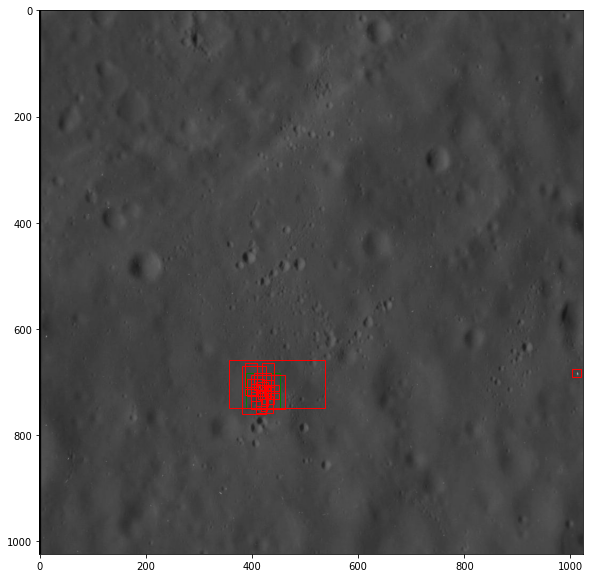

No of GT Boxes:  1
Loss function value for this image= tensor(0.1133, grad_fn=<NllLossBackward>)
Indices obtained
[118641, 117480, 117498, 118623, 119802, 119784, 116337, 116319, 191800, 117462, 115194, 120957, 118605, 119766, 122106, 119800, 116301, 176251, 117469, 115176]
Initial objectness scores at these indices
[0.49885094 0.5001091  0.50325    0.49935114 0.50243723 0.49940762
 0.49964607 0.5003652  0.5001495  0.5000738  0.50193566 0.5011436
 0.50083953 0.50054204 0.50083697 0.5001398  0.5003426  0.49945068
 0.49608937 0.49951684]
Final Objectness scores:
[0.5792868  0.55686176 0.5384059  0.52389807 0.5150878  0.4879973
 0.46641064 0.44704783 0.42932773 0.41987294 0.39643583 0.37518477
 0.36863962 0.36366817 0.35449657 0.34645846 0.32465822 0.3244523
 0.31509823 0.30560663]
Original Label values at these indices
[-1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1]
No of proposals: 20


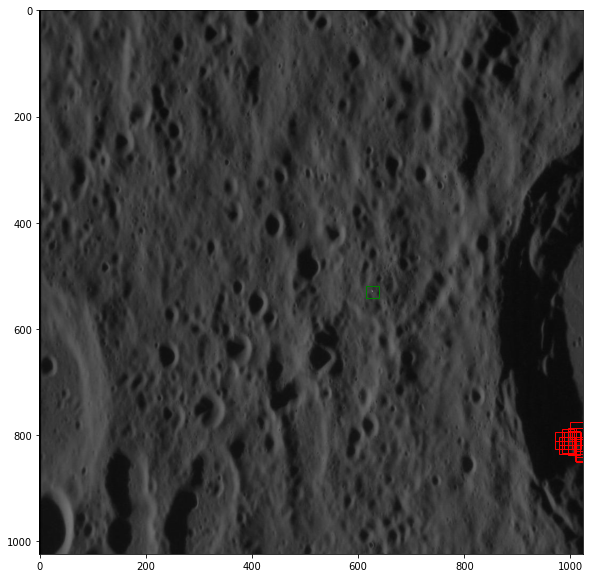

No of GT Boxes:  1
Loss function value for this image= tensor(0.0029, grad_fn=<NllLossBackward>)
Indices obtained
[58684, 58683, 57540, 194540, 56389, 161815, 59844, 57533, 56379, 57522, 58701, 162387, 56397, 58699, 196120, 55236, 188043, 196119, 194536, 162972]
Initial objectness scores at these indices
[0.5013278  0.50109106 0.49873847 0.54047745 0.49923536 0.4964929
 0.5024388  0.5004822  0.49826816 0.5000892  0.50011814 0.5015153
 0.49942145 0.5035587  0.4983407  0.49767166 0.5020155  0.5053277
 0.50076044 0.5046696 ]
Final Objectness scores:
[0.81823575 0.7901131  0.7711099  0.71343875 0.6919913  0.6857704
 0.6841923  0.6598444  0.6565446  0.64783937 0.6377322  0.6051727
 0.54971737 0.5093251  0.46607748 0.46267882 0.45585924 0.45029518
 0.4440855  0.43255907]
Original Label values at these indices
[ 1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1  1  0 -1]
No of proposals: 20


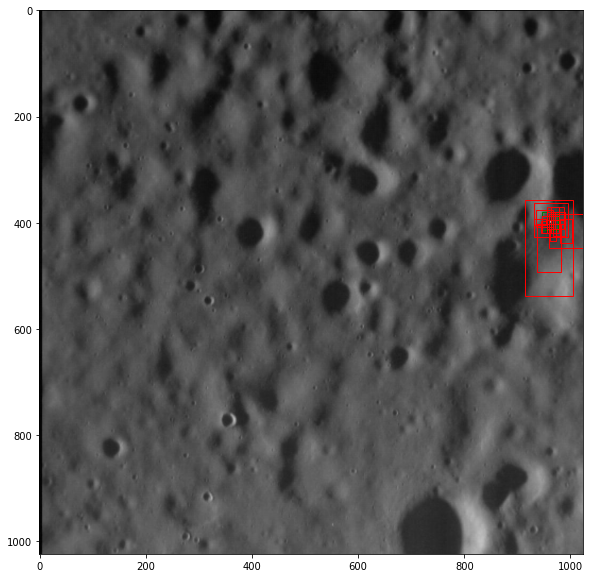

No of GT Boxes:  7
Loss function value for this image= tensor(0.0757, grad_fn=<NllLossBackward>)
Indices obtained
[25393, 153517, 193904, 162751, 100840, 26544, 76153, 153516, 25395, 162750, 76152, 100839, 194702, 153525, 184930, 185920, 190522, 59385, 172524, 59377]
Initial objectness scores at these indices
[0.49933615 0.49812722 0.49857387 0.5023868  0.5004458  0.4989189
 0.5020925  0.50575185 0.50111806 0.5035689  0.49913785 0.4987789
 0.48645023 0.5059419  0.5005408  0.5029657  0.50064224 0.49754044
 0.50338596 0.4968898 ]
Final Objectness scores:
[0.8522879  0.8453383  0.8302934  0.82196176 0.8163673  0.8122011
 0.80625886 0.78619206 0.7729718  0.76849467 0.76752806 0.7570151
 0.7563728  0.75098705 0.7476498  0.7446084  0.74299556 0.7342977
 0.7318722  0.7315255 ]
Original Label values at these indices
[-1 -1  0 -1 -1 -1 -1 -1 -1 -1 -1 -1  0 -1 -1 -1 -1 -1 -1 -1]
No of proposals: 20


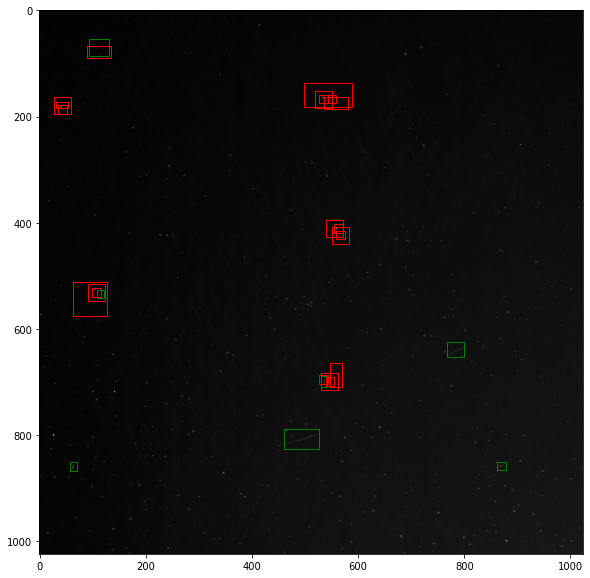

No of GT Boxes:  1
Loss function value for this image= tensor(0.0145, grad_fn=<NllLossBackward>)
Indices obtained
[70293, 164749, 164739, 69144, 71436, 71454, 164754, 70274, 164163, 194552, 69147, 71424, 188656, 164175, 196060, 75621, 165330, 188359, 164178, 196056]
Initial objectness scores at these indices
[0.50080603 0.500641   0.5019105  0.5037317  0.50065494 0.4995427
 0.50344783 0.49983677 0.5024739  0.47922686 0.49910626 0.49991181
 0.5018883  0.5005023  0.50408274 0.4979939  0.5019558  0.49805102
 0.50409186 0.49870253]
Final Objectness scores:
[0.64144695 0.6179071  0.5784283  0.56524265 0.5065987  0.48981127
 0.47435078 0.4494525  0.4364494  0.4298554  0.42557648 0.42413825
 0.41087824 0.40703326 0.3964396  0.34756094 0.34628424 0.3394159
 0.33336067 0.31638652]
Original Label values at these indices
[-1  1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1  1 -1 -1 -1 -1  0]
No of proposals: 20


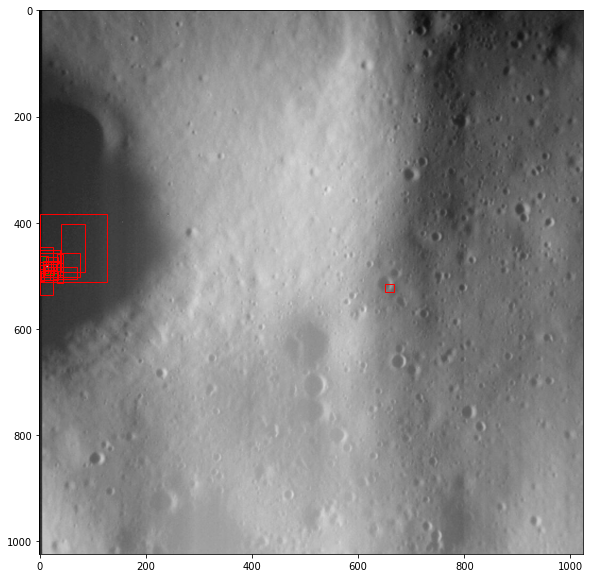

No of GT Boxes:  1
Loss function value for this image= tensor(0.0016, grad_fn=<NllLossBackward>)
Indices obtained
[109219, 174424, 109227, 108066, 174426, 174990, 109220, 110388, 110389, 196255, 196254, 195233, 106917, 191178, 174406, 191175, 174405, 174981, 175572, 174985]
Initial objectness scores at these indices
[0.49916673 0.49526638 0.5017034  0.5029176  0.49728218 0.5030988
 0.5044052  0.5027653  0.49977025 0.49758175 0.5014739  0.4883575
 0.5002787  0.5040775  0.49550593 0.5020253  0.50200415 0.50134367
 0.4999071  0.49409655]
Final Objectness scores:
[0.8487429  0.80210453 0.8009204  0.76688784 0.7493246  0.7485224
 0.7427964  0.6925145  0.6906906  0.62904656 0.61778176 0.61678034
 0.61072034 0.60411865 0.5936424  0.5722981  0.54995865 0.5451005
 0.5327092  0.513257  ]
Original Label values at these indices
[ 1 -1 -1 -1 -1 -1 -1 -1 -1  0  1 -1 -1 -1 -1 -1 -1 -1 -1 -1]
No of proposals: 20


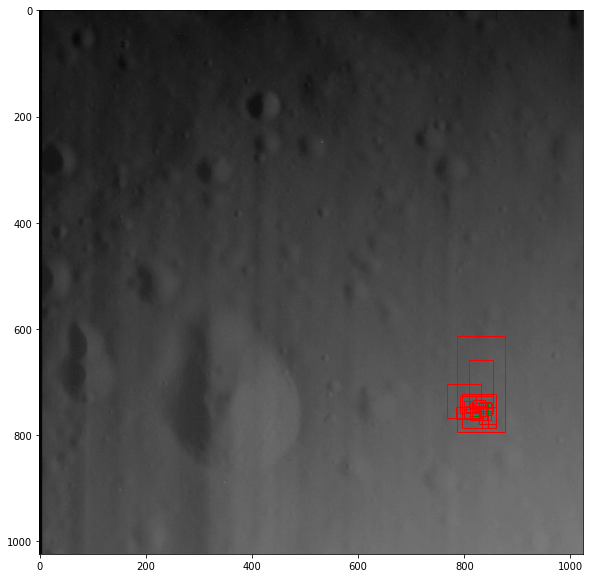

No of GT Boxes:  1
Loss function value for this image= tensor(0.0036, grad_fn=<NllLossBackward>)
Indices obtained
[60385, 60384, 59223, 61527, 60386, 187894, 162661, 61545, 60366, 59241, 62688, 58080, 162084, 58069, 62680, 187885, 62670, 56919, 61509, 60402]
Initial objectness scores at these indices
[0.50474983 0.5001219  0.49692687 0.49964324 0.50785244 0.5042185
 0.49672735 0.50214666 0.49960363 0.49991632 0.49977937 0.5008574
 0.50306535 0.49789456 0.5042344  0.50548935 0.499114   0.5007346
 0.49887624 0.50242984]
Final Objectness scores:
[0.81245935 0.7816126  0.71671766 0.7097282  0.66757625 0.66452795
 0.6609488  0.63074344 0.62083477 0.6161342  0.598211   0.5975655
 0.56422424 0.51990485 0.5004689  0.49599117 0.46827236 0.42956704
 0.4285058  0.42049024]
Original Label values at these indices
[ 1 -1 -1 -1 -1  1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1]
No of proposals: 20


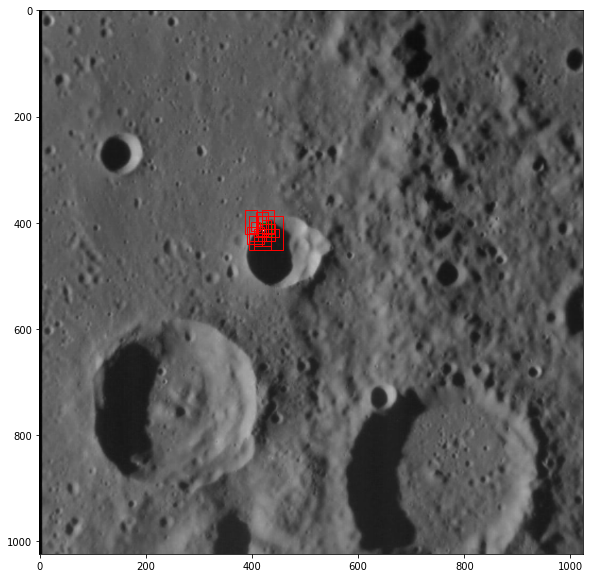

No of GT Boxes:  2
Loss function value for this image= tensor(0.0255, grad_fn=<NllLossBackward>)
Indices obtained
[31324, 34402, 9913, 93190, 9130, 54796, 165299, 11064, 68710, 165295, 31332, 31325, 46840, 34401, 195398, 44329, 186103, 93189, 9903, 194639]
Initial objectness scores at these indices
[0.49399984 0.50088954 0.50047004 0.5044801  0.4997781  0.4983184
 0.5046751  0.4998998  0.5015202  0.49859613 0.49785972 0.5008902
 0.4963352  0.5006157  0.51202005 0.49631205 0.5027249  0.49910673
 0.4947179  0.50009686]
Final Objectness scores:
[0.8850708  0.853601   0.849365   0.8277879  0.8161081  0.81407744
 0.8127009  0.81006575 0.807896   0.80720854 0.80456084 0.8035717
 0.801503   0.80136955 0.7985836  0.7877331  0.78708375 0.7869016
 0.7844928  0.7816095 ]
Original Label values at these indices
[-1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1  0]
No of proposals: 20


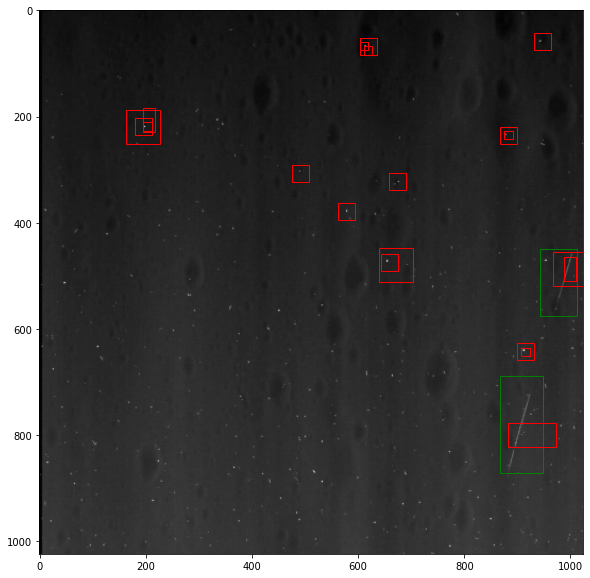

No of GT Boxes:  1
Loss function value for this image= tensor(0.2472, grad_fn=<NllLossBackward>)
Indices obtained
[72777, 71634, 11361, 71616, 73938, 73920, 70473, 90840, 10218, 10200, 75081, 40314, 72795, 12504, 92001, 72759, 12000, 196408, 188686, 9057]
Initial objectness scores at these indices
[0.505354   0.50243723 0.50643855 0.50276417 0.50230706 0.50464284
 0.5038078  0.5006936  0.50572944 0.50445163 0.5022685  0.49711722
 0.5045641  0.50440943 0.49973875 0.5047208  0.5016494  0.49596688
 0.5044238  0.5055307 ]
Final Objectness scores:
[0.37830496 0.3463963  0.32986876 0.32326415 0.31769234 0.30101252
 0.29879802 0.29667002 0.2924484  0.28692496 0.28034854 0.27975953
 0.2772181  0.27687743 0.27540958 0.27188155 0.26888257 0.26552776
 0.2611887  0.2580405 ]
Original Label values at these indices
[-1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1  0 -1 -1]
No of proposals: 20


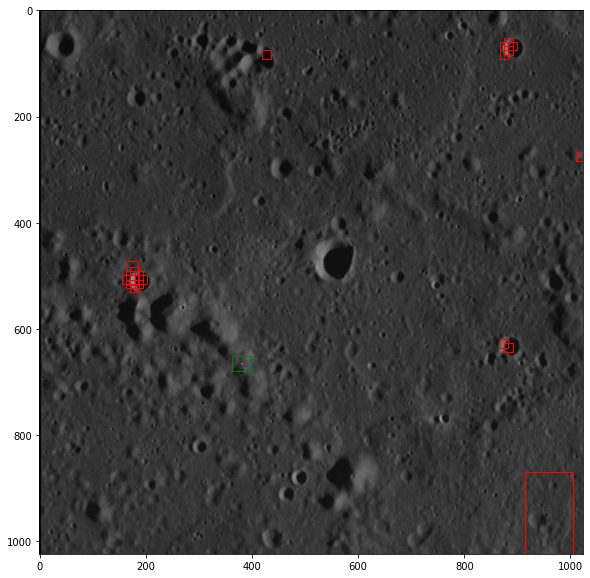

No of GT Boxes:  4
Loss function value for this image= tensor(0.0441, grad_fn=<NllLossBackward>)
Indices obtained
[104557, 195233, 163795, 7402, 195955, 155272, 7401, 104556, 99706, 195954, 64929, 196252, 185653, 171454, 76225, 188467, 66090, 179050, 31755, 76224]
Initial objectness scores at these indices
[0.49979126 0.50141436 0.49742904 0.49992767 0.4984277  0.49871016
 0.5001773  0.5006902  0.4994272  0.50108486 0.4989919  0.49776477
 0.5007318  0.5018447  0.4996055  0.5039493  0.49987167 0.49858353
 0.50209427 0.49974647]
Final Objectness scores:
[0.8233956  0.81892216 0.80158883 0.7795996  0.7777635  0.7684283
 0.7652958  0.7632891  0.75498456 0.7519958  0.75199306 0.7443438
 0.74340147 0.7405125  0.7401647  0.7361693  0.7305238  0.73011816
 0.7261153  0.72349894]
Original Label values at these indices
[-1 -1 -1 -1  0 -1 -1 -1 -1  0  1  0 -1 -1 -1 -1 -1 -1 -1 -1]
No of proposals: 20


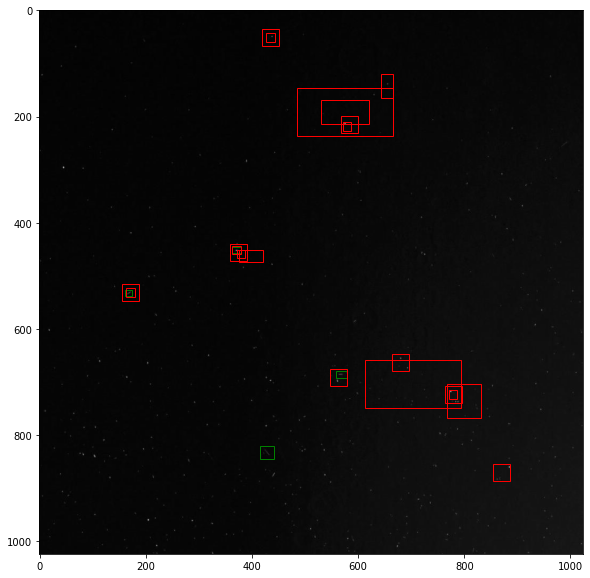

No of GT Boxes:  1
Loss function value for this image= tensor(0.0471, grad_fn=<NllLossBackward>)
Indices obtained
[169452, 196138, 196137, 86628, 1146, 87789, 169443, 169456, 170028, 2, 196054, 195916, 196345, 196408, 148025, 196399, 20073, 196198, 168867, 168885]
Initial objectness scores at these indices
[0.500891   0.50061655 0.5013733  0.49803543 0.49898085 0.49795306
 0.5004221  0.5014486  0.49963218 0.50088656 0.5057146  0.5036011
 0.4993424  0.49642384 0.49806398 0.49342448 0.5056153  0.5049075
 0.5010209  0.5016754 ]
Final Objectness scores:
[0.2987254  0.2779649  0.26906714 0.22895062 0.21763976 0.21120887
 0.20177068 0.19830579 0.1916421  0.19007213 0.16953646 0.16883633
 0.16849819 0.16557856 0.16510709 0.16473463 0.16215184 0.15746573
 0.15600474 0.15569045]
Original Label values at these indices
[-1  0  1 -1 -1 -1 -1  1 -1 -1  0  0  0  0 -1  0 -1  0 -1 -1]
No of proposals: 20


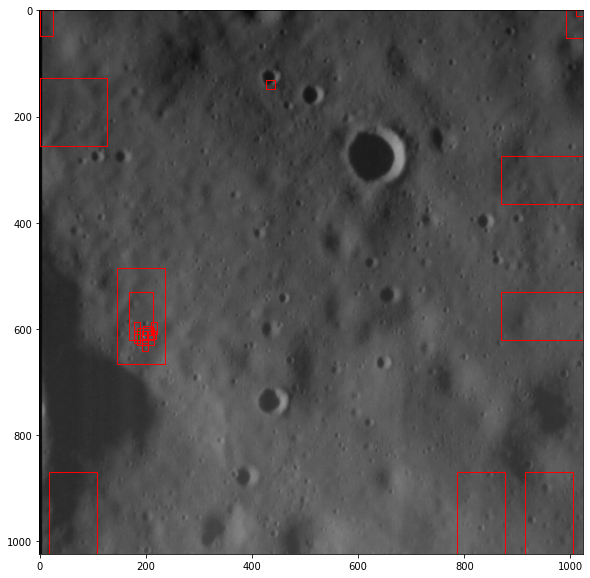

No of GT Boxes:  1
Loss function value for this image= tensor(0.1099, grad_fn=<NllLossBackward>)
Indices obtained
[131322, 133626, 117174, 176670, 116013, 118353, 176679, 132477, 130173, 118335, 129018, 117156, 186427, 118317, 117219, 196198, 34932, 176094, 114897, 176085]
Initial objectness scores at these indices
[0.4963086  0.4965993  0.4971217  0.5022436  0.49954045 0.49664667
 0.5033386  0.5005381  0.5017696  0.49677402 0.49596837 0.50032455
 0.50208294 0.49930224 0.49753883 0.5017195  0.5008777  0.5013979
 0.49680012 0.50078946]
Final Objectness scores:
[0.34587568 0.29281121 0.28838414 0.28113976 0.2719953  0.27137104
 0.2694306  0.2681445  0.26336354 0.26049268 0.260311   0.25848275
 0.25778767 0.2574895  0.2542711  0.25071174 0.2501453  0.24768528
 0.24061376 0.23362933]
Original Label values at these indices
[-1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1  0 -1 -1 -1 -1]
No of proposals: 20


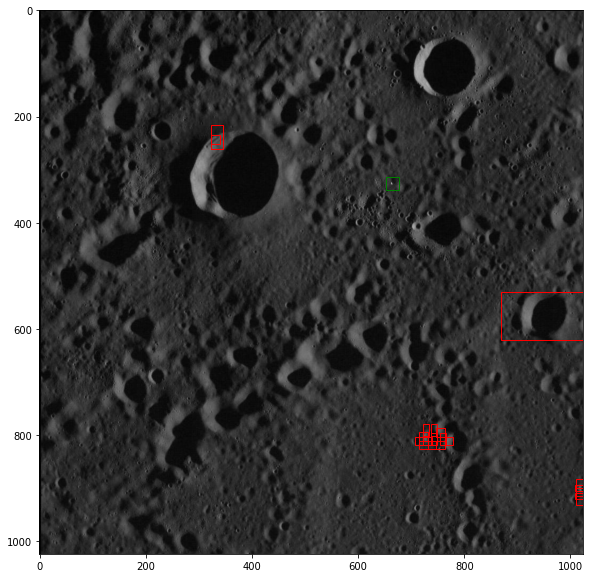

No of GT Boxes:  5
Loss function value for this image= tensor(0.1006, grad_fn=<NllLossBackward>)
Indices obtained
[169762, 25564, 79870, 169761, 79869, 195964, 25563, 189997, 195963, 171319, 89537, 157846, 164956, 89526, 195970, 90687, 153319, 196153, 187189, 170341]
Initial objectness scores at these indices
[0.5002081  0.5026138  0.499214   0.50255233 0.5006392  0.49435574
 0.50183606 0.5024905  0.5008555  0.49717915 0.50204813 0.5010072
 0.50030994 0.4972384  0.5032405  0.49771246 0.49716857 0.49699193
 0.5045936  0.5056977 ]
Final Objectness scores:
[0.83940375 0.794668   0.79273254 0.77766335 0.7629416  0.7529874
 0.7520643  0.7463521  0.7402144  0.7364982  0.733804   0.72961503
 0.72420347 0.72306013 0.7202771  0.71815467 0.7178288  0.7107159
 0.70701414 0.70615107]
Original Label values at these indices
[-1 -1 -1 -1 -1  0 -1 -1  0 -1 -1 -1 -1 -1  0 -1 -1  0  0 -1]
No of proposals: 20


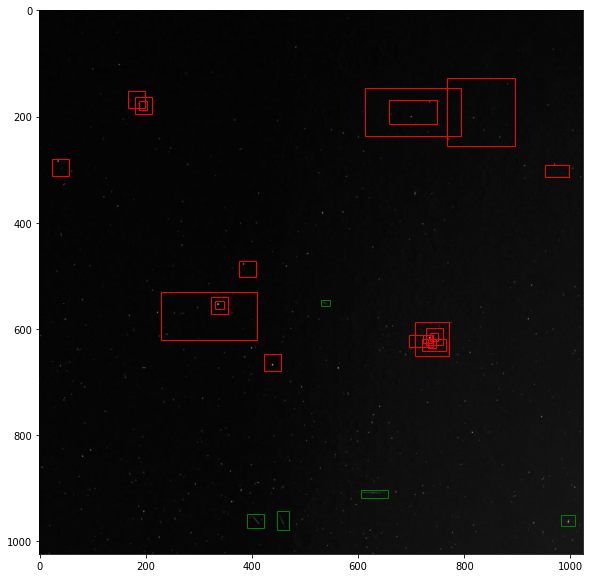

No of GT Boxes:  1
Loss function value for this image= tensor(0.0297, grad_fn=<NllLossBackward>)
Indices obtained
[143473, 143472, 142311, 144627, 143474, 184050, 142329, 141168, 143454, 144201, 144612, 184057, 183843, 182893, 191017, 182889, 66684, 141172, 184041, 12666]
Initial objectness scores at these indices
[0.4952562  0.50007963 0.49891192 0.5031216  0.50071716 0.50098926
 0.49847278 0.4995657  0.5014241  0.49886435 0.50248766 0.5038744
 0.5002301  0.4975454  0.505359   0.5042988  0.50207293 0.4986226
 0.50094867 0.50103366]
Final Objectness scores:
[0.7176953  0.7120114  0.61413354 0.58676744 0.49709404 0.4824702
 0.46049184 0.4532868  0.44887003 0.44073358 0.42604244 0.40326887
 0.40162593 0.39739552 0.39146513 0.39074567 0.38013858 0.3768411
 0.37508878 0.37132034]
Original Label values at these indices
[-1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1]
No of proposals: 20


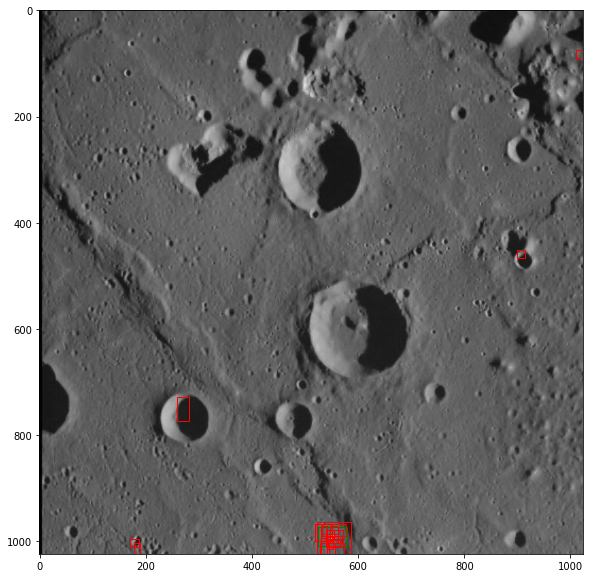

No of GT Boxes:  1
Loss function value for this image= tensor(0.0975, grad_fn=<NllLossBackward>)
Indices obtained
[11514, 150903, 10365, 122412, 9210, 150331, 177552, 11496, 14970, 1146, 150329, 121269, 2, 148025, 12639, 178119, 177543, 6906, 8061, 147450]
Initial objectness scores at these indices
[0.49964666 0.5006625  0.50206053 0.50155175 0.49879438 0.4960977
 0.50539005 0.49966955 0.4985788  0.49937543 0.49395442 0.4993781
 0.5012105  0.49728343 0.4990419  0.50361377 0.5040937  0.4987673
 0.5012321  0.5003874 ]
Final Objectness scores:
[0.36237672 0.3164233  0.29600176 0.2872241  0.27519017 0.26746836
 0.26193166 0.25491902 0.2480932  0.2418845  0.239458   0.22593272
 0.21230653 0.2122397  0.21016517 0.20372847 0.19868836 0.19657466
 0.1956533  0.19556855]
Original Label values at these indices
[-1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1]
No of proposals: 20


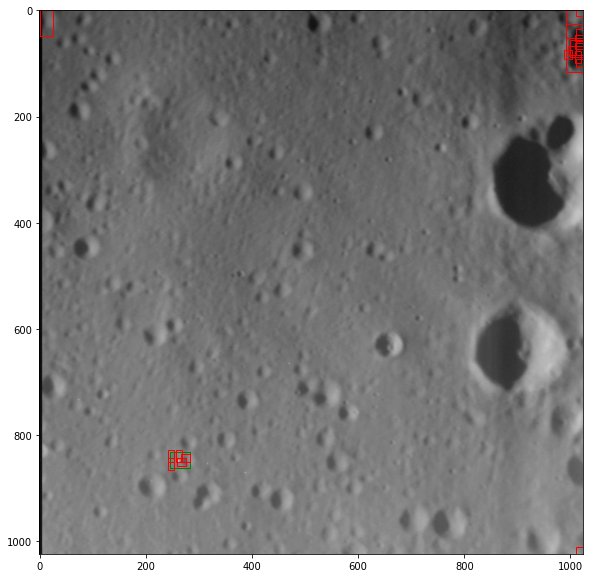

No of GT Boxes:  5
Loss function value for this image= tensor(0.0366, grad_fn=<NllLossBackward>)
Indices obtained
[65128, 65129, 44698, 102694, 92749, 163309, 163893, 188512, 163884, 188503, 76378, 188218, 44697, 63975, 92748, 196099, 196044, 102693, 102695, 166054]
Initial objectness scores at these indices
[0.48816332 0.5149123  0.50034314 0.50223416 0.49908507 0.4945234
 0.51024973 0.5047724  0.5036234  0.5048218  0.4994416  0.5091318
 0.49904904 0.5100249  0.5001762  0.4987289  0.50262266 0.50082666
 0.49930692 0.49960494]
Final Objectness scores:
[0.90671724 0.86154103 0.851663   0.84529674 0.84335166 0.8296592
 0.8285526  0.8193971  0.79739696 0.7938207  0.7919031  0.78808504
 0.7871874  0.7861189  0.78579193 0.7842434  0.7734343  0.768159
 0.75804156 0.7574517 ]
Original Label values at these indices
[ 1 -1  1  1 -1 -1 -1 -1 -1 -1  1 -1 -1 -1 -1 -1 -1 -1 -1 -1]
No of proposals: 20


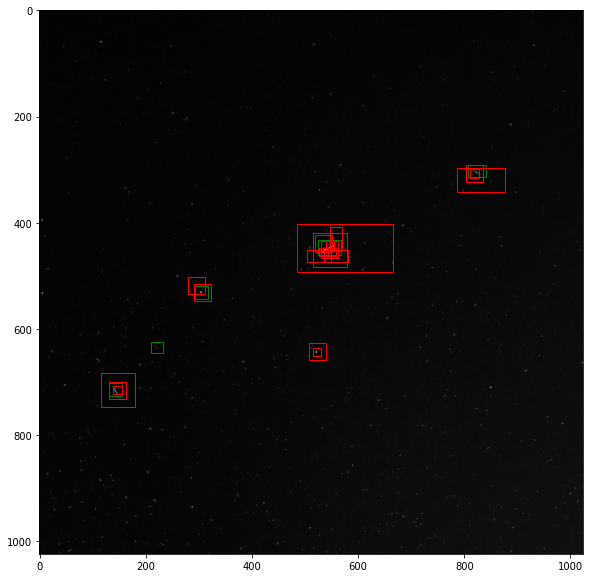

No of GT Boxes:  4
Loss function value for this image= tensor(0.0160, grad_fn=<NllLossBackward>)
Indices obtained
[115645, 195326, 56587, 70987, 56595, 70986, 195325, 176475, 191341, 176487, 55434, 69825, 55453, 56588, 56577, 70988, 57738, 55452, 114501, 116818]
Initial objectness scores at these indices
[0.4973229  0.47820678 0.4940843  0.49757794 0.49823716 0.49956897
 0.51183355 0.5004906  0.4999978  0.49847618 0.49830225 0.5011171
 0.49499387 0.50362    0.4986706  0.5041067  0.49978685 0.4988354
 0.50146234 0.49628335]
Final Objectness scores:
[0.870526   0.86127406 0.86070013 0.84666175 0.80985814 0.7972717
 0.78048176 0.7798313  0.77403307 0.76965284 0.7627327  0.7562457
 0.7474737  0.73249084 0.7306102  0.73059314 0.7294079  0.7156254
 0.7145356  0.7069387 ]
Original Label values at these indices
[ 1 -1  1  1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1]
No of proposals: 20


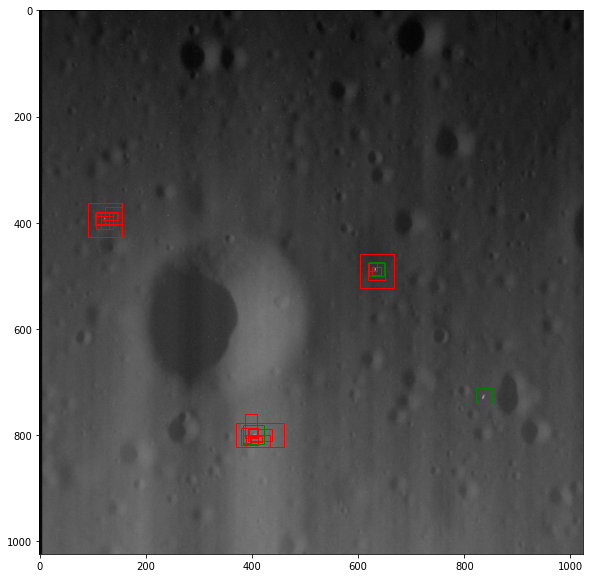

No of GT Boxes:  17
Loss function value for this image= tensor(0.2209, grad_fn=<NllLossBackward>)
Indices obtained
[109066, 33061, 108049, 33060, 8941, 196096, 109065, 187543, 8940, 186247, 155343, 178132, 109067, 108048, 195233, 110208, 195961, 174334, 109191, 33062]
Initial objectness scores at these indices
[0.50096947 0.5016905  0.5019497  0.5010102  0.50192606 0.49992165
 0.5016374  0.5022482  0.49914247 0.4987455  0.50294995 0.4978531
 0.50033706 0.4993273  0.47716552 0.50062287 0.5019052  0.49303463
 0.49898645 0.5038053 ]
Final Objectness scores:
[0.83084804 0.8304064  0.79273087 0.7802935  0.7755829  0.7684353
 0.76511526 0.7594648  0.7558423  0.75001216 0.7397775  0.7382042
 0.7356282  0.7323426  0.73046345 0.72922546 0.7258952  0.7186041
 0.7174516  0.7163246 ]
Original Label values at these indices
[ 1 -1 -1 -1 -1  0 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1  0 -1 -1 -1]
No of proposals: 20


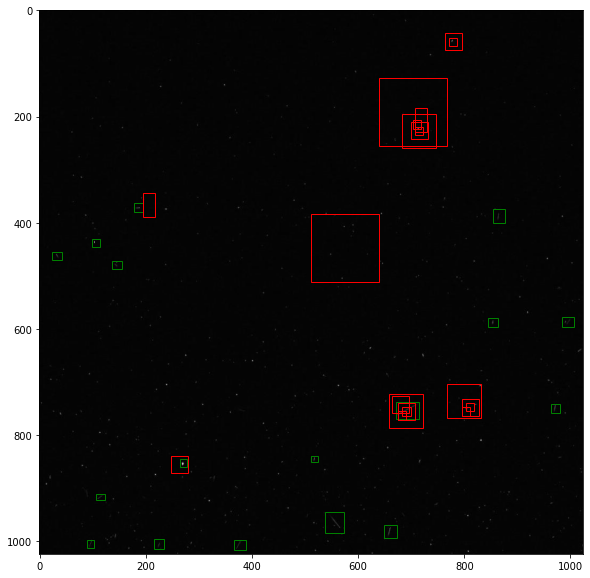

No of GT Boxes:  1
Loss function value for this image= tensor(0.0015, grad_fn=<NllLossBackward>)
Indices obtained
[50431, 194369, 50430, 187417, 187426, 49269, 160008, 51573, 50412, 160582, 187708, 51591, 48126, 50404, 52734, 48108, 160563, 49251, 187425, 159432]
Initial objectness scores at these indices
[0.4966011  0.46638408 0.50087637 0.5007119  0.49997067 0.50010026
 0.49415267 0.50171936 0.497911   0.49664617 0.50361526 0.5017187
 0.49930525 0.4982274  0.501157   0.4973068  0.500098   0.49611592
 0.50236714 0.49580857]
Final Objectness scores:
[0.9014357  0.8515582  0.83634824 0.8300476  0.8007104  0.79768777
 0.7625817  0.7606558  0.74264973 0.7414875  0.7285923  0.7176285
 0.6833305  0.67718846 0.67197675 0.63719726 0.63714606 0.6285161
 0.6183504  0.5904641 ]
Original Label values at these indices
[ 1 -1 -1  1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1]
No of proposals: 20


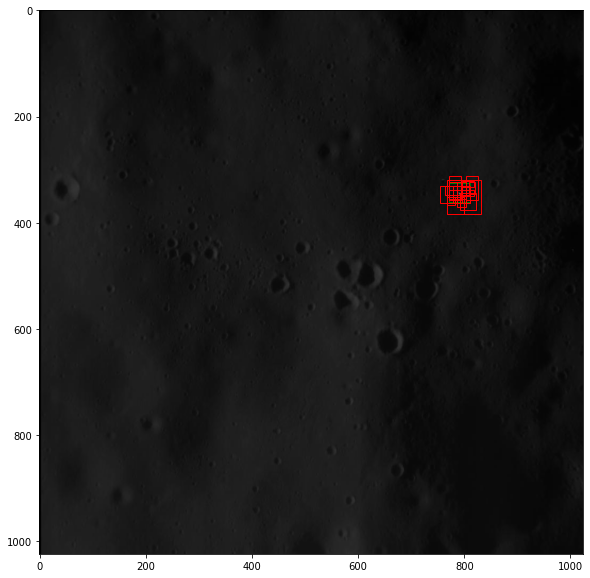

No of GT Boxes:  1
Loss function value for this image= tensor(0.2065, grad_fn=<NllLossBackward>)
Indices obtained
[188110, 61257, 162525, 62400, 60114, 62418, 61259, 187822, 58953, 63561, 61275, 60115, 161946, 162513, 162517, 188119, 58971, 60132, 57810, 161937]
Initial objectness scores at these indices
[0.5037862  0.49950045 0.49392253 0.50126904 0.50147086 0.50019324
 0.500351   0.5012558  0.4994476  0.5018321  0.49912354 0.49548537
 0.49971774 0.50052243 0.4862614  0.50219774 0.49700096 0.5008671
 0.4979496  0.50029063]
Final Objectness scores:
[0.63587916 0.56113493 0.5263894  0.5070678  0.487086   0.48366007
 0.46257234 0.44643086 0.44087234 0.4379198  0.43419227 0.43131438
 0.42802367 0.42077562 0.41606766 0.3975303  0.37940913 0.37458315
 0.37086907 0.37074757]
Original Label values at these indices
[-1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1  0 -1 -1 -1 -1 -1]
No of proposals: 20


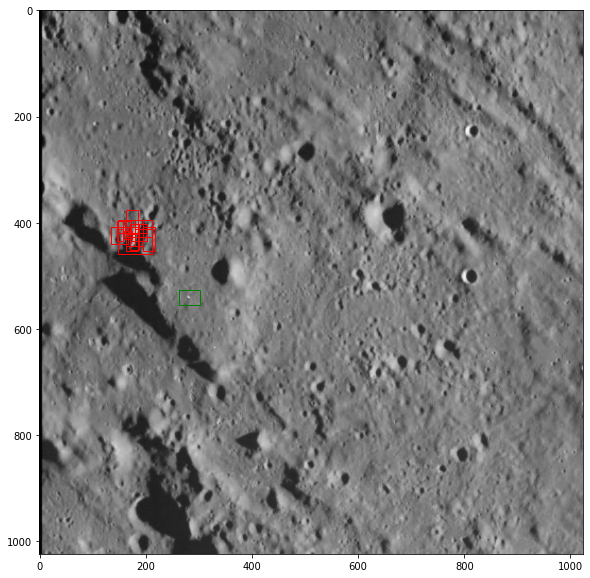

No of GT Boxes:  6
Loss function value for this image= tensor(0.0446, grad_fn=<NllLossBackward>)
Indices obtained
[82993, 21451, 116617, 126283, 71815, 82992, 160879, 21450, 152428, 70843, 126282, 116616, 178465, 116618, 71814, 152418, 196075, 196087, 170986, 21452]
Initial objectness scores at these indices
[0.5024038  0.5062802  0.49702653 0.50295115 0.50023395 0.5040671
 0.49718457 0.5062932  0.49786258 0.50005835 0.5035519  0.50298685
 0.4970951  0.501784   0.5017329  0.50171435 0.50672376 0.49283302
 0.50004023 0.5124944 ]
Final Objectness scores:
[0.879219   0.8707221  0.86944133 0.841125   0.83154225 0.8236487
 0.8228763  0.8228567  0.8163217  0.8084549  0.80481774 0.80361927
 0.7984877  0.790761   0.79001856 0.7853469  0.7847119  0.7797531
 0.7753583  0.7750785 ]
Original Label values at these indices
[-1 -1 -1 -1 -1 -1 -1 -1 -1  1  1  1 -1 -1 -1 -1  0  1 -1 -1]
No of proposals: 20


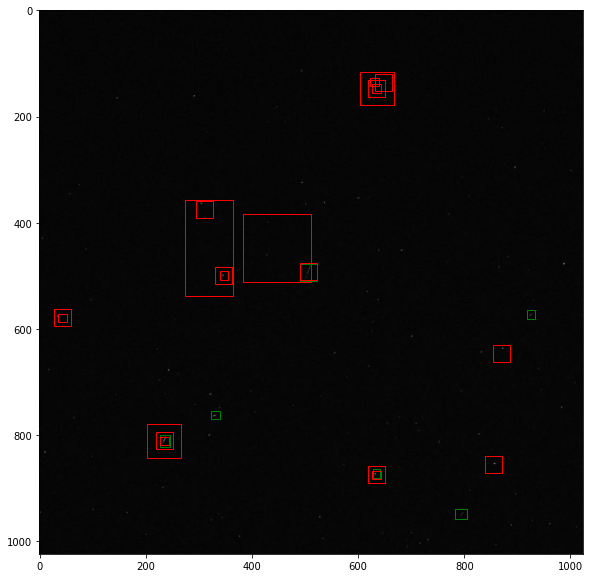

No of GT Boxes:  3
Loss function value for this image= tensor(0.0113, grad_fn=<NllLossBackward>)
Indices obtained
[139612, 139611, 67162, 138468, 167305, 80022, 67161, 182118, 139613, 166900, 189358, 194756, 78060, 140772, 66018, 189439, 167313, 196074, 181552, 167475]
Initial objectness scores at these indices
[0.50144607 0.50021046 0.5001227  0.5030742  0.49871498 0.50033534
 0.49927926 0.50343454 0.50506514 0.49787366 0.50514853 0.4802211
 0.49738348 0.502416   0.5006237  0.50283015 0.50423574 0.5041236
 0.49935907 0.5020887 ]
Final Objectness scores:
[0.8622595  0.8200856  0.78739417 0.77511823 0.77083117 0.7588318
 0.7583343  0.75685155 0.7409984  0.7360431  0.7319396  0.7248583
 0.7224017  0.7115097  0.7046109  0.7010674  0.6925487  0.691963
 0.691605   0.68992126]
Original Label values at these indices
[ 1 -1 -1 -1 -1 -1 -1 -1 -1  1 -1 -1 -1 -1 -1 -1 -1  0 -1 -1]
No of proposals: 20


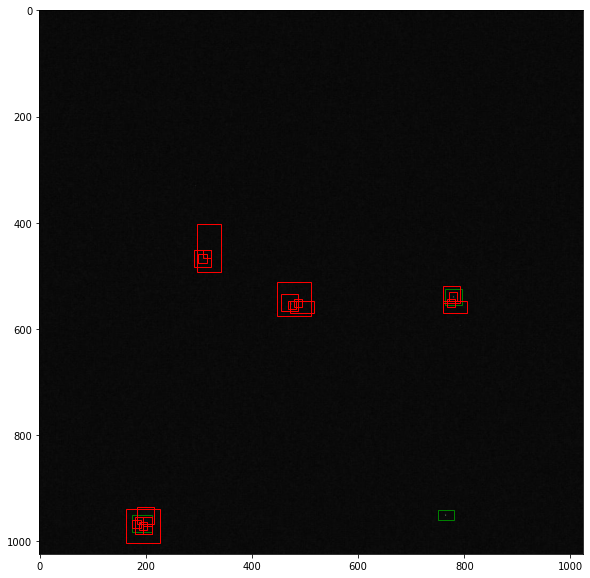

No of GT Boxes:  1
Loss function value for this image= tensor(0.0076, grad_fn=<NllLossBackward>)
Indices obtained
[180265, 130134, 180273, 131277, 179698, 179688, 192670, 130136, 179700, 180255, 132438, 180282, 179680, 179709, 179679, 132456, 132420, 132474, 179704, 192375]
Initial objectness scores at these indices
[0.5007051  0.50066334 0.49853235 0.50084895 0.49776962 0.50095195
 0.5040656  0.50206065 0.500608   0.5010163  0.5015397  0.49913803
 0.49643078 0.49712163 0.5017612  0.5018494  0.49999723 0.49981296
 0.5003154  0.49993363]
Final Objectness scores:
[0.78992397 0.7330583  0.69754964 0.6910906  0.628058   0.6176233
 0.5939128  0.59052974 0.58703434 0.58675355 0.5842071  0.5685021
 0.5340794  0.49450883 0.49415326 0.48393354 0.4640457  0.44340938
 0.43537828 0.42127767]
Original Label values at these indices
[-1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1]
No of proposals: 20


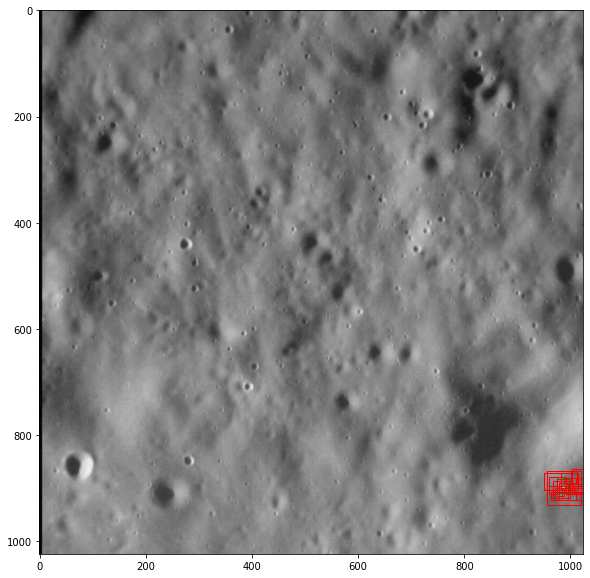

No of GT Boxes:  1
Loss function value for this image= tensor(0.0205, grad_fn=<NllLossBackward>)
Indices obtained
[105429, 173677, 174249, 106572, 173664, 104286, 174244, 173682, 174258, 107727, 103125, 190810, 105434, 108885, 196236, 196243, 174262, 173655, 173088, 174231]
Initial objectness scores at these indices
[0.49692777 0.49754184 0.5002148  0.49948058 0.50240046 0.49818107
 0.49947423 0.501052   0.5005333  0.5011089  0.49727216 0.5022544
 0.4979438  0.50087154 0.5000777  0.4984982  0.5007224  0.5021159
 0.5026625  0.5006574 ]
Final Objectness scores:
[0.53936815 0.50712246 0.49910137 0.45168912 0.4440633  0.407368
 0.38488644 0.3798233  0.3710377  0.33536866 0.31453124 0.31137624
 0.3025336  0.29510754 0.27547723 0.26441535 0.26126996 0.24376386
 0.2405344  0.22366701]
Original Label values at these indices
[-1  1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1  0  1 -1 -1 -1 -1]
No of proposals: 20


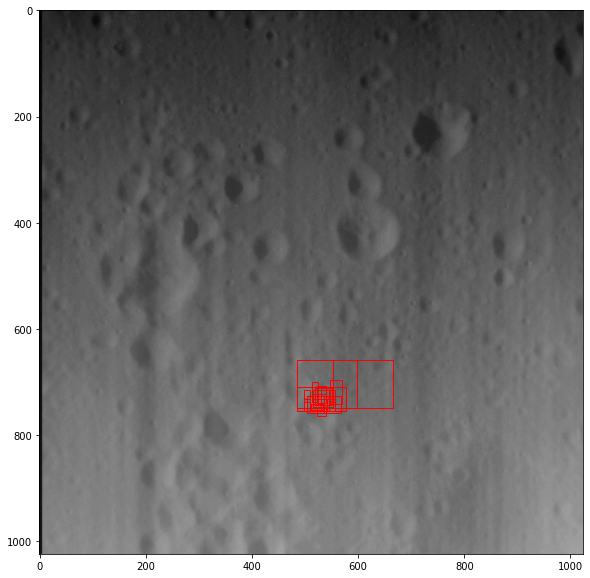

No of GT Boxes:  2
Loss function value for this image= tensor(0.0427, grad_fn=<NllLossBackward>)
Indices obtained
[177727, 120441, 121602, 119298, 191674, 119308, 121584, 120452, 120459, 191683, 177162, 76485, 122745, 119280, 120423, 118137, 75342, 189037, 196315, 177715]
Initial objectness scores at these indices
[0.48862517 0.49670658 0.49801818 0.49829486 0.508412   0.496682
 0.49759486 0.4953295  0.49867386 0.50677764 0.4971936  0.4983573
 0.4968664  0.49849623 0.49631596 0.4987104  0.49907225 0.504107
 0.49468246 0.49459895]
Final Objectness scores:
[0.7014402  0.66803354 0.63062465 0.6304243  0.61451787 0.60209775
 0.59647095 0.58526075 0.58282775 0.5827969  0.56240076 0.56223625
 0.55767065 0.535842   0.5076953  0.49959663 0.4947469  0.48732024
 0.4864627  0.47739273]
Original Label values at these indices
[-1 -1 -1 -1 -1 -1 -1  1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1]
No of proposals: 20


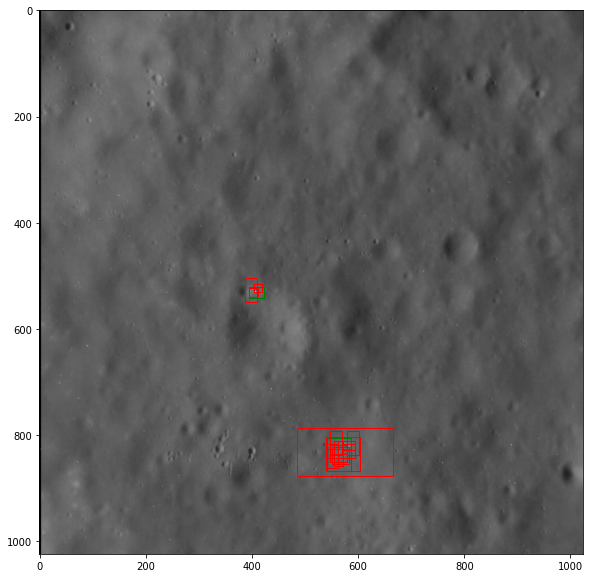

No of GT Boxes:  1
Loss function value for this image= tensor(0.1753, grad_fn=<NllLossBackward>)
Indices obtained
[1146, 2, 148025, 117506, 196390, 196060, 21882, 812, 176832, 176256, 184605, 196372, 1073, 947, 195982, 196198, 19578, 196381, 196414, 175680]
Initial objectness scores at these indices
[0.49933827 0.5006248  0.49758503 0.5013007  0.49783224 0.50626945
 0.4986044  0.50108683 0.49984416 0.4993024  0.5007946  0.49810576
 0.50276023 0.50576186 0.5012708  0.5026224  0.49819797 0.4972646
 0.5005842  0.5005484 ]
Final Objectness scores:
[0.21996148 0.20203327 0.19167186 0.19099188 0.18477349 0.18231285
 0.1776815  0.17278473 0.16965747 0.16900241 0.16717625 0.16645828
 0.16628426 0.15640011 0.153555   0.15345691 0.15176067 0.14954886
 0.1493729  0.14639033]
Original Label values at these indices
[-1 -1 -1 -1  0  0 -1 -1 -1 -1 -1  0 -1 -1  0  0 -1  0  0 -1]
No of proposals: 20


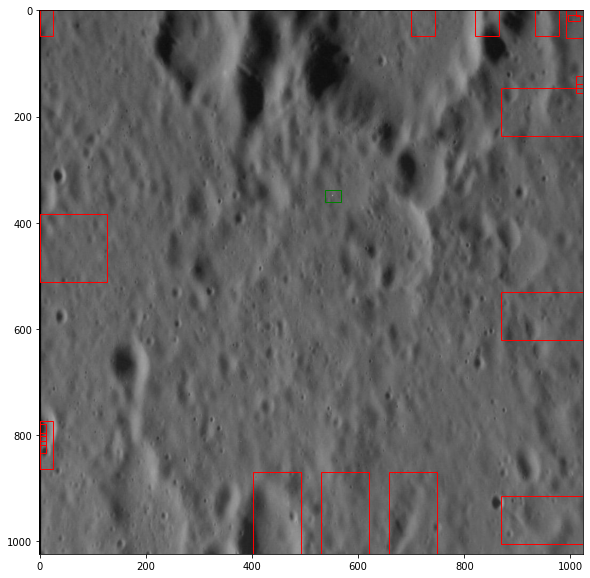

No of GT Boxes:  4
Loss function value for this image= tensor(0.0577, grad_fn=<NllLossBackward>)
Indices obtained
[43744, 72949, 43743, 100714, 72948, 109147, 43745, 100713, 42600, 154579, 158376, 181282, 191161, 44904, 109146, 187186, 183082, 173038, 71787, 72950]
Initial objectness scores at these indices
[0.5019074  0.5012152  0.50278825 0.49929854 0.499899   0.49679545
 0.5071054  0.49882522 0.5038365  0.4997658  0.5017711  0.49893898
 0.50175124 0.5036675  0.49992546 0.50215364 0.49294722 0.5005567
 0.49852073 0.50345594]
Final Objectness scores:
[0.89153963 0.8631733  0.8341879  0.8325628  0.81191003 0.8094601
 0.79582405 0.7913215  0.7764956  0.7741819  0.76732606 0.7653493
 0.76390785 0.76112044 0.7590959  0.7560414  0.75300485 0.7516752
 0.7477876  0.74752253]
Original Label values at these indices
[-1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1  0 -1 -1 -1 -1]
No of proposals: 20


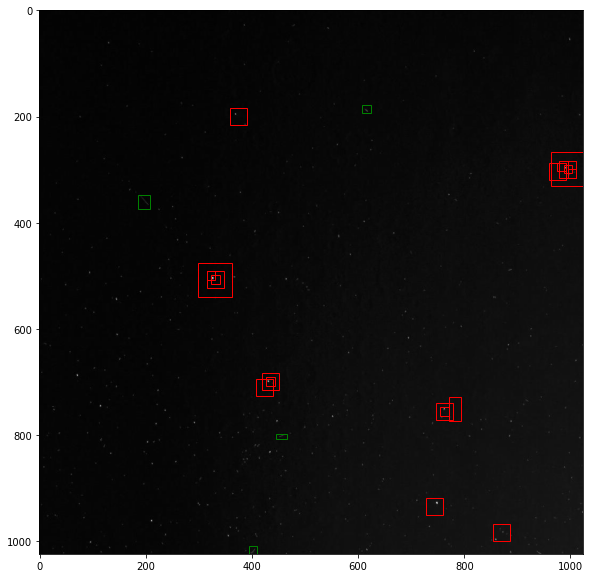

No of GT Boxes:  3
Loss function value for this image= tensor(0.0299, grad_fn=<NllLossBackward>)
Indices obtained
[91318, 193901, 90184, 182515, 91326, 91319, 153517, 109309, 196240, 90165, 90183, 92469, 140394, 152356, 174046, 190159, 141529, 153516, 109308, 91308]
Initial objectness scores at these indices
[0.49721044 0.47712383 0.49658442 0.5009299  0.49933344 0.49659815
 0.49625397 0.50560826 0.508375   0.49913839 0.49859518 0.4985149
 0.4999529  0.49986902 0.4998405  0.5030829  0.50251406 0.5030278
 0.5029113  0.49734148]
Final Objectness scores:
[0.8403354  0.837071   0.7820905  0.7756587  0.76612884 0.76400644
 0.75873023 0.73595124 0.7351555  0.7329387  0.7215517  0.7212978
 0.7191678  0.7114468  0.7085271  0.70539045 0.7015456  0.695963
 0.69557214 0.69386446]
Original Label values at these indices
[ 1  1 -1 -1 -1 -1 -1 -1  0 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1]
No of proposals: 20


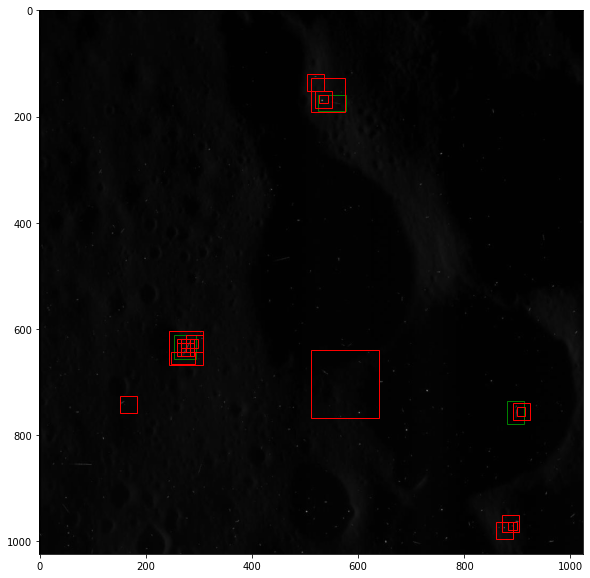

No of GT Boxes:  1
Loss function value for this image= tensor(0.0770, grad_fn=<NllLossBackward>)
Indices obtained
[63354, 30927, 71715, 1146, 65658, 64509, 32088, 29784, 62205, 30945, 72876, 32070, 22764, 61050, 70572, 71697, 70554, 153648, 72858, 2]
Initial objectness scores at these indices
[0.4978228  0.50408274 0.5056006  0.49892592 0.49780816 0.49992204
 0.505273   0.5046685  0.49954736 0.5055791  0.5032273  0.50499713
 0.49828744 0.4972012  0.5035018  0.5046351  0.5032335  0.49698398
 0.50318533 0.5008885 ]
Final Objectness scores:
[0.38430184 0.34341386 0.3332072  0.30979717 0.3090081  0.30758983
 0.30303562 0.29554465 0.29311594 0.28662208 0.2857881  0.28172636
 0.28001028 0.27130124 0.26811624 0.26790252 0.2609184  0.26074177
 0.2565294  0.25357628]
Original Label values at these indices
[-1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1  0]
No of proposals: 20


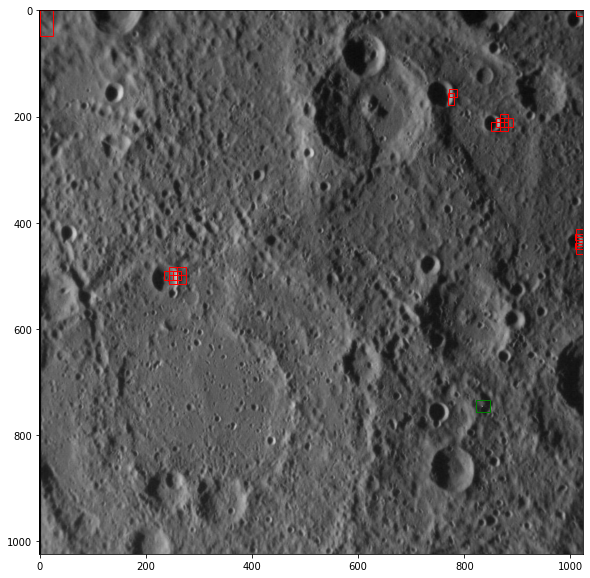

No of GT Boxes:  2
Loss function value for this image= tensor(0.0043, grad_fn=<NllLossBackward>)
Indices obtained
[84613, 84370, 84369, 84612, 117616, 84614, 83469, 117615, 83220, 195275, 85530, 83451, 85512, 168321, 84371, 176305, 85773, 116472, 118776, 176877]
Initial objectness scores at these indices
[0.498218   0.4940633  0.49894765 0.50054765 0.501452   0.5016427
 0.49882647 0.4993549  0.50089794 0.49752432 0.50083417 0.5003906
 0.5005118  0.5035102  0.50530064 0.49893    0.5004095  0.4994714
 0.5010662  0.4998749 ]
Final Objectness scores:
[0.8620142  0.8552162  0.82183886 0.8035616  0.760285   0.7538579
 0.7520228  0.749919   0.73467225 0.7237471  0.7071284  0.7036348
 0.70222473 0.69625103 0.69455606 0.67780554 0.6760714  0.6669722
 0.65778625 0.6562404 ]
Original Label values at these indices
[ 1 -1 -1 -1 -1 -1 -1 -1  1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1]
No of proposals: 20


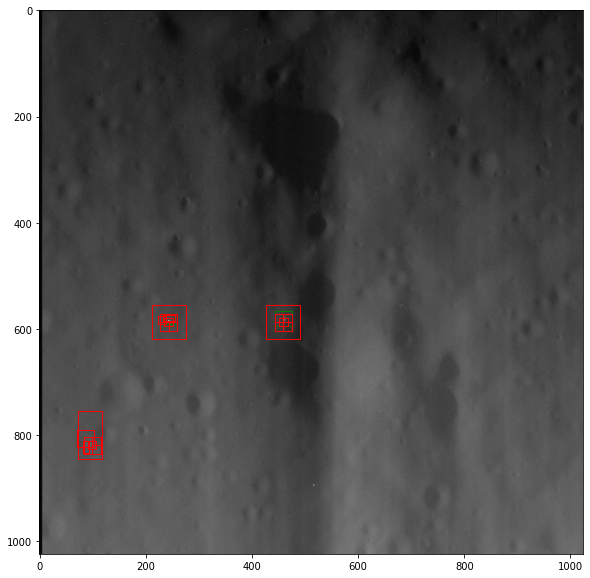

In [ ]:
for index in range(30):
  Show_predicted_anchors(crismis_dataset['valid'],index,model,rpn,fl)

In [ ]:
def Show_Final_Proposals(data,index,model_cpu):
  ind = index
  labels_np = data[ind][1]
  loc_np = data[ind][2]
  labels = torch.from_numpy(labels_np)
  input_image = data[ind][0]
  gt_bbox,lab = data.parse_voc_xml(ET.parse(data.annotations[ind]).getroot())
  # print("No of GT Boxes: ", len(gt_bbox))
  cls_output, reg_output = model_cpu(input_image)
  
  soft= nn.Softmax(dim=1)
  objectness_score = soft(cls_output[0])[:,1]
  score_numpy = objectness_score.data.numpy()

  # print('*')
  # nms_thresh = 0.1

  # anchors = np.zeros((196416, 4),dtype=np.float32)
  a = Anchors()
  anchors  = a.generate_all()
  # print('*')
  pred_anchor_locs_numpy = reg_output[0].data.numpy()
  # print('*')
  anc_height = anchors[:, 2] - anchors[:, 0]
  anc_width = anchors[:, 3] - anchors[:, 1]
  anc_ctr_y = anchors[:, 0] + 0.5 * anc_height
  anc_ctr_x = anchors[:, 1] + 0.5 * anc_width

  dy = pred_anchor_locs_numpy[:, 0::4]
  dx = pred_anchor_locs_numpy[:, 1::4]
  dh = pred_anchor_locs_numpy[:, 2::4]
  dw = pred_anchor_locs_numpy[:, 3::4]

  # get the predicted box centers, height and width
  ctr_y = dy * anc_height[:, np.newaxis] + anc_ctr_y[:, np.newaxis]
  ctr_x = dx * anc_width[:, np.newaxis] + anc_ctr_x[:, np.newaxis]
  h = np.exp(dh) * anc_height[:, np.newaxis]
  w = np.exp(dw) * anc_width[:, np.newaxis]
  # print('*')
  # Convert loc to y1,x1,y2,x2 format
  roi = np.zeros(pred_anchor_locs_numpy.shape, dtype=anchors.dtype)
  roi[:, 0::4] = ctr_y - 0.5 * h*2
  roi[:, 1::4] = ctr_x - 0.5 * w*2
  roi[:, 2::4] = ctr_y + 0.5 * h*2
  roi[:, 3::4] = ctr_x + 0.5 * w*2
  img_size = (1024, 1024) #Image size
  roi[:, slice(0, 4, 2)] = np.clip(
              roi[:, slice(0, 4, 2)], 0, img_size[0])
  roi[:, slice(1, 4, 2)] = np.clip(
      roi[:, slice(1, 4, 2)], 0, img_size[1])
  # print("Valid ROI's")
  # print(roi)

# Decreasing order of confidence
  order = score_numpy.argsort()[::-1]
  score_numpy = score_numpy[order]
  roi = roi[order,:]
  anchors = anchors[order,:]

#   print("Top 20 scores before nms", score_numpy[:20])
  # Keep only the regions larger than minimum size
  min_size = 16
  hs = roi[:, 2] - roi[:, 0]
  ws = roi[:, 3] - roi[:, 1]
  keep = np.where((hs >= min_size) & (ws >= min_size))[0]
  roi = roi[keep,:]
  anchors = anchors[keep,:]
  score_numpy = score_numpy[keep]
  roi_tensor = torch.from_numpy(roi)
  score_tensor = torch.from_numpy(score_numpy)
  final_order_indices = torchvision.ops.nms( roi_tensor , score_tensor, 0.05)
  indices = np.where(score_numpy[final_order_indices]>0.5)[0]
  if (len(indices)>20):
    indices = indices[:20]
  print("No of proposals:", len(indices))
  print('Final scores', score_numpy[final_order_indices[indices]])
#   Final regions of interest boxes and scores as output by the proposal network 
  anchors = np.expand_dims(anchors[final_order_indices[indices],:], axis=0) if (len(indices)==1) else anchors[final_order_indices[indices],:]
  roi = np.expand_dims(roi[final_order_indices[indices],:], axis=0) if (len(indices)==1) else roi[final_order_indices[indices],:]
  score_numpy = np.expand_dims(score_numpy[final_order_indices[indices]], axis=0) if (len(indices)==1) else score_numpy[final_order_indices[indices]]
  show_visual_results(data[ind][0].view(3,1024,1024),gt_bbox,anchors,roi, ind)
#   return gt_bbox, roi, score_numpy

In [ ]:
def show_visual_results(inp, gt_bbox, anchors,roi, ind):
  """Imshow for Tensor."""
  inp = inp.numpy().transpose((1, 2, 0))
  mean = np.array([0.5, 0.5, 0.5])
  std = np.array([0.5, 0.5, 0.5])
  inp = std * inp + mean
  inp = np.clip(inp, 0, 1)

  fig, axs = plt.subplots(1, 2)
  # print(axs.shape)
  axs[0].imshow(inp)
  axs[0].set_title('GROUND TRUTH')
  # fig.set_title('subplot 1')
  # plt.imshow(inp)
  # plot each box
  for box in gt_bbox:
    # get coordinates
    y1, x1, y2, x2 = box
    y1-=15
    x1-=15
    y2+=15
    x2+=15
    # calculate width and height of the box
    width, height = x2 - x1, y2 - y1
    # create the shape
    rect = Rectangle((x1, y1), width, height, fill=False, color='green')
    # draw the box
    axs[0].add_patch(rect)

  axs[1].imshow(inp)
  axs[1].set_title('FINAL BOXES')
  for box in roi:
    # get coordinates
    y1, x1, y2, x2 = box
    y1-=10
    x1-=10
    y2+=10
    x2+=10
    # calculate width and height of the box
    width, height = x2 - x1, y2 - y1
    # create the shape
    rect = Rectangle((x1, y1), width, height, fill=False, color='red')
    # draw the box
    axs[1].add_patch(rect)
    
  plt.show()

  # if not os.path.exists('drive/My Drive/CRISMIS/resnet50/exp4/results/valid'):
  #     os.makedirs('drive/My Drive/CRISMIS/resnet50/exp4/results/valid')
  # fig.savefig('drive/My Drive/CRISMIS/resnet50/exp4/results/valid/' + str(ind) + '.png' )
  # plt.close()

Final Objectness scores:
[0.93105197 0.90404224 0.8759227  0.848603   0.83622795 0.8211963
 0.8211963  0.8211963  0.8211963  0.7707147  0.7499007  0.7499007
 0.7499007  0.58763224 0.58763224 0.5465221  0.5465221  0.5465221
 0.5465221  0.5465221 ]


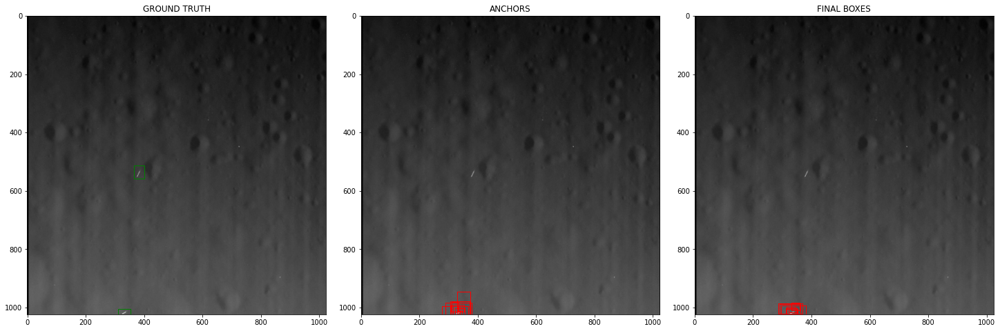

Final Objectness scores:
[0.88788736 0.60192645 0.46538877 0.4621704  0.4621704  0.4621704
 0.4621704  0.31504223 0.2721901  0.2721901  0.2721901  0.2721901
 0.2721901  0.2721901  0.2721901  0.2721901  0.2721901  0.2721901
 0.2721901  0.2721901 ]


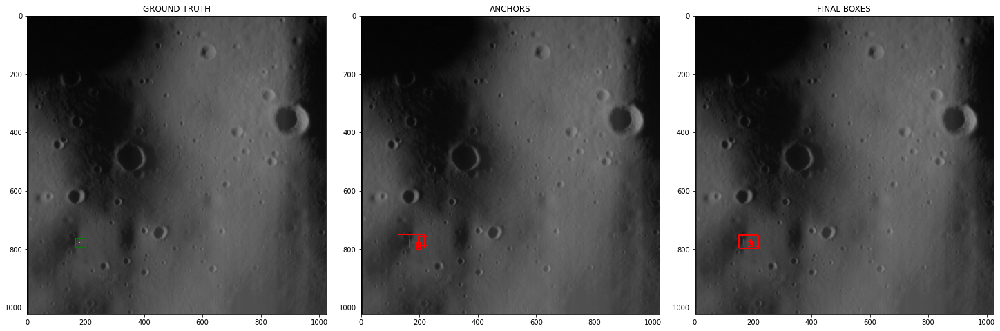

Final Objectness scores:
[0.8612174  0.84851813 0.84851813 0.84851813 0.7362245  0.6860028
 0.64987075 0.64987075 0.64987075 0.59427845 0.59427845 0.59427845
 0.59427845 0.4995651  0.4995651  0.4995651  0.4995651  0.4995651
 0.4995651  0.4851354 ]


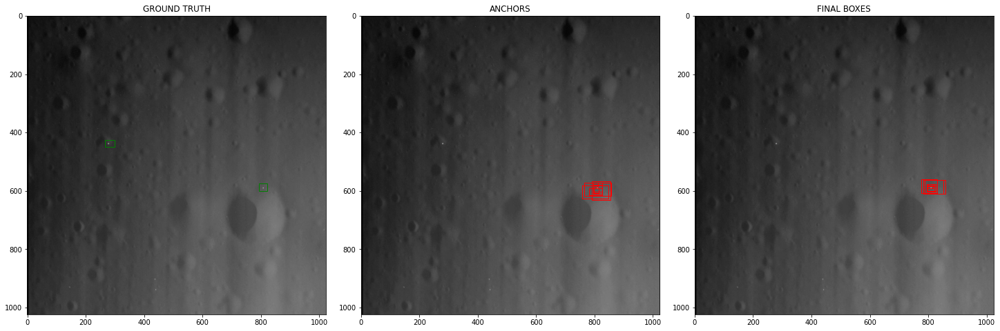

Final Objectness scores:
[0.8382237  0.60022753 0.46917745 0.43067545 0.3794341  0.32441977
 0.32441977 0.32441977 0.32441977 0.32441977 0.22319847 0.22319847
 0.22319847 0.21104257 0.21104257 0.21104257 0.21104257 0.21104257
 0.1943597  0.19428496]


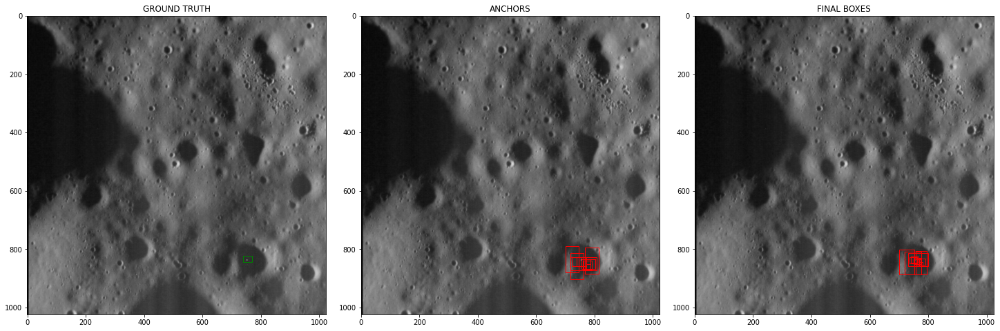

Final Objectness scores:
[0.85453033 0.70279676 0.63416827 0.6193294  0.6088898  0.5894765
 0.51132923 0.4960897  0.4960897  0.4960897  0.4960897  0.4960897
 0.41937283 0.41937283 0.36939815 0.36939815 0.36939815 0.36939815
 0.36939815 0.36939815]


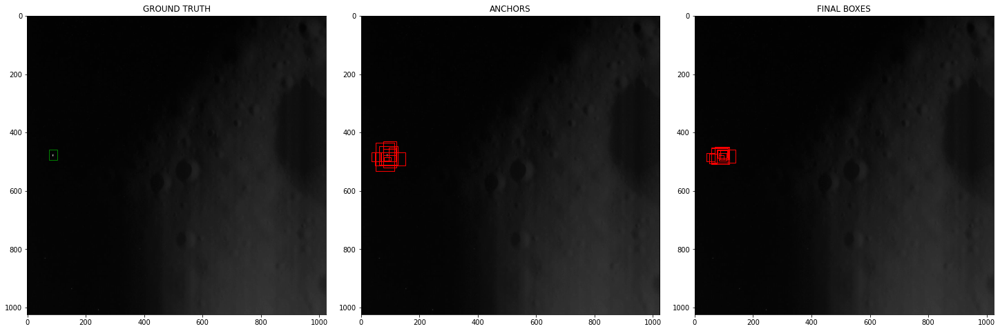

Final Objectness scores:
[0.7545728  0.5553202  0.52796286 0.449011   0.449011   0.449011
 0.2687761  0.24829696 0.21483408 0.21483408 0.12581797 0.12581797
 0.11822122 0.11822122 0.1164564  0.1164564  0.1164564  0.1164564
 0.1164564  0.1164564 ]


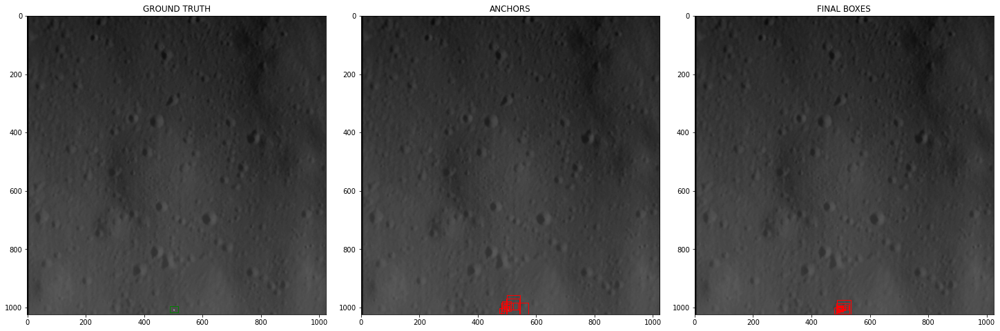

Final Objectness scores:
[0.86136395 0.86112654 0.86112654 0.86112654 0.86112654 0.86112654
 0.86112654 0.8160938  0.75177586 0.75177586 0.75177586 0.75177586
 0.75177586 0.75177586 0.7489522  0.7489522  0.7489522  0.6866046
 0.6866046  0.6866046 ]


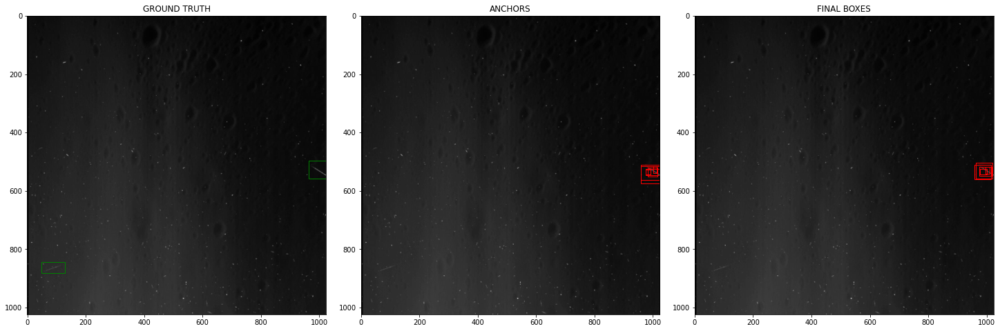

Final Objectness scores:
[0.6560243 0.6331024 0.6331024 0.6331024 0.6263776 0.6263776 0.6263776
 0.6263776 0.6263776 0.6263776 0.6263776 0.6263776 0.6263776 0.6263776
 0.5839065 0.5839065 0.5839065 0.5839065 0.5839065 0.5839065]


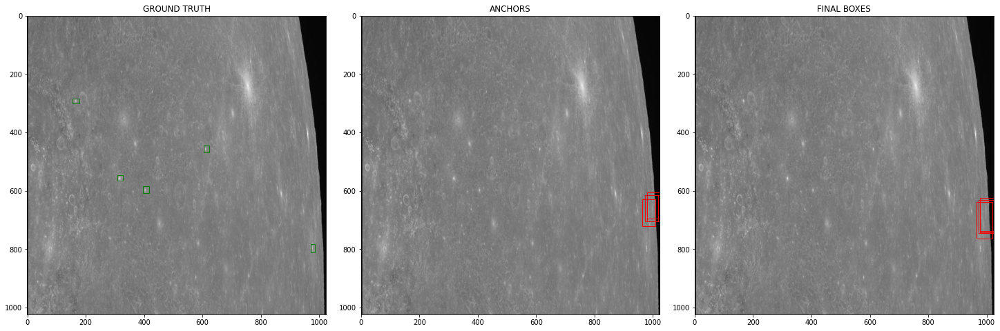

Final Objectness scores:
[0.32857743 0.27875808 0.24901855 0.24901855 0.24901855 0.22081406
 0.22081406 0.22081406 0.22081406 0.22081406 0.22081406 0.22081406
 0.22081406 0.22081406 0.22081406 0.20399094 0.20399094 0.20399094
 0.20399094 0.20399094]


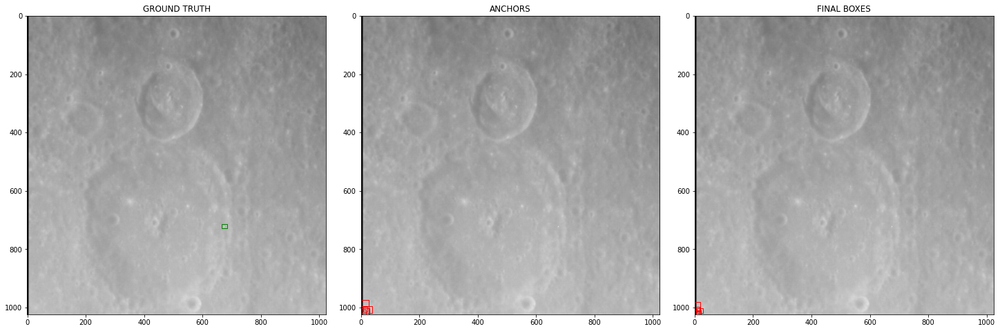

Final Objectness scores:
[0.8729822  0.5182864  0.5016201  0.36368483 0.31766313 0.2981121
 0.28981596 0.28063145 0.22962028 0.22962028 0.22962028 0.20033135
 0.20033135 0.20033135 0.1691531  0.1691531  0.1691531  0.1691531
 0.1691531  0.12603207]


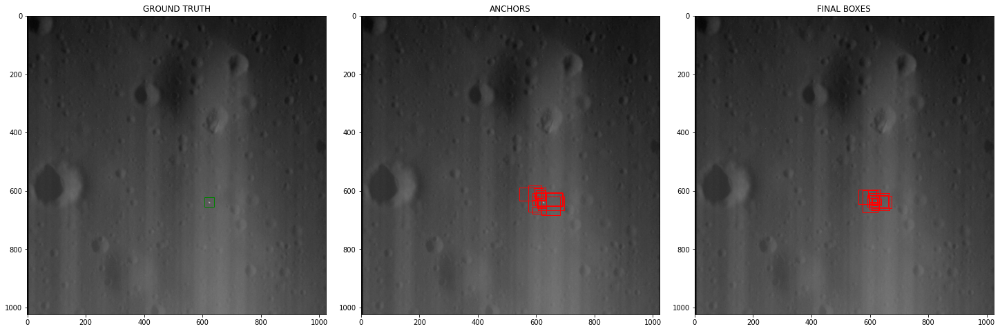

In [ ]:
for index in range(10):
  Show_Final_Proposals(crismis_dataset['train'],index,model)